In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
! pip install -q ..


[notice] A new release of pip is available: 23.0 -> 23.1
[notice] To update, run: pip install --upgrade pip


In [1]:
import mouse_gait_analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from skimage import draw

from mouse_gait_analysis.io import *
from mouse_gait_analysis.utils import *
from mouse_gait_analysis.plots import *

In [2]:
# data_folder = Path("/shared/thea/trial-analysis/")
data_folder = Path("/home/andretelfer/shared/curated/thea/v3")
! ls {data_folder}/

analysis_config.yaml  registration_points.csv  view_transforms.csv
datafiles.csv	      treatments.csv
labels		      videos


In [101]:
treatments = pd.read_csv(data_folder/'treatments.csv')
treatments['mouse'] = treatments.Animal.apply(lambda x: f"m{x:02}")
treatments['treatment'] = treatments['Treatment ']
treatments = treatments[['mouse', 'treatment']]

,mouse,treatment
0,m01,PQ
1,m02,SAL
2,m03,PQ
3,m04,SAL
4,m05,PQ
...,...,...
91,m20,SAL
92,m21,LPS
93,m22,LPS
94,m23,LPS


In [98]:
raw_videos = [
    'm01_baseline.mp4',
    'm01_recording1.mp4',
    'm01_recording2.mp4',
    'm01_recording3.mp4',
]
raw_videos = list(map(lambda x: Path(data_folder / 'videos' / x), raw_videos))

In [3]:
raw_videos = []

for mouse in treatments[treatments.treatment.isin(['PQ', 'SAL'])].mouse.unique():
    raw_videos.append(data_folder / 'videos' / f"{mouse}_baseline.mp4")
    raw_videos.append(data_folder / 'videos' / f"{mouse}_recording1.mp4")
    raw_videos.append(data_folder / 'videos' / f"{mouse}_recording2.mp4")
    raw_videos.append(data_folder / 'videos' / f"{mouse}_recording3.mp4")

NameError: name 'treatments' is not defined

In [ ]:
raw_videos = list(data_folder.glob('videos/*.mp4'))
print(len(raw_videos))
raw_videos = list(filter(lambda x: 'labeled' not in x.parts[-1], raw_videos))

32
Video 1/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3635/3635 [00:13<00:00, 275.81it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m01_baseline, steps: 801 -- left_back_paw, stride-length: 4.04 +/- 2.42, duration: 11.38 +/- 7.80


100%|██████████| 3809/3809 [00:13<00:00, 279.51it/s]


m01_baseline, steps: 914 -- right_back_paw, stride-length: 4.09 +/- 2.46, duration: 12.56 +/- 7.47


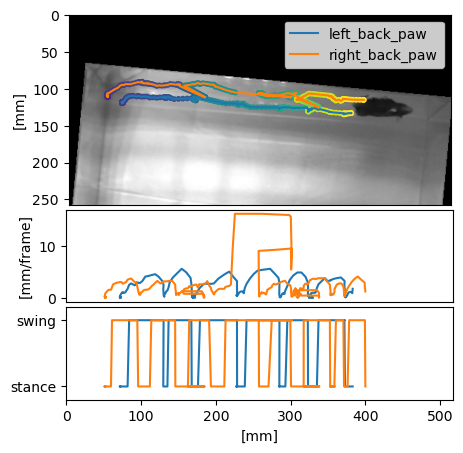

100%|██████████| 64083/64083 [00:00<00:00, 248097.46it/s]


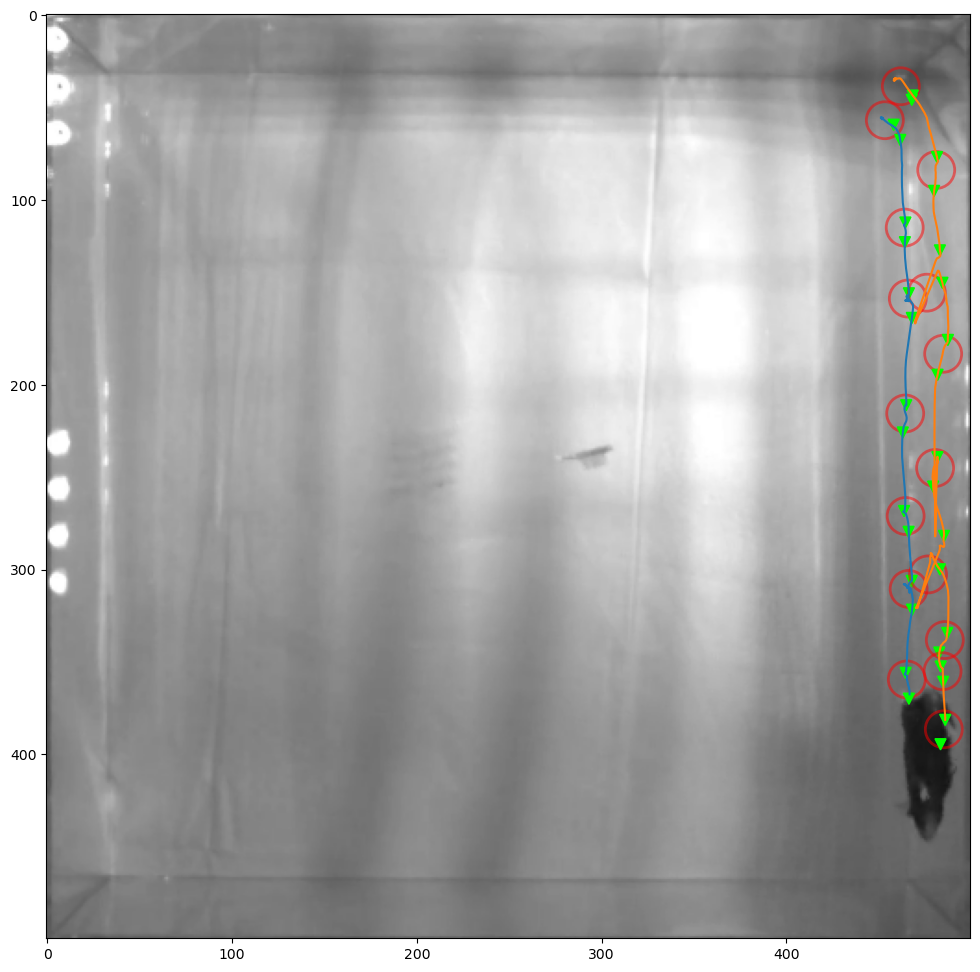

Video 2/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2105/2105 [00:06<00:00, 312.86it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m01_recording1, steps: 412 -- left_back_paw, stride-length: 4.20 +/- 2.55, duration: 12.05 +/- 7.57


100%|██████████| 2161/2161 [00:06<00:00, 317.38it/s]


m01_recording1, steps: 438 -- right_back_paw, stride-length: 4.67 +/- 3.04, duration: 14.12 +/- 8.13


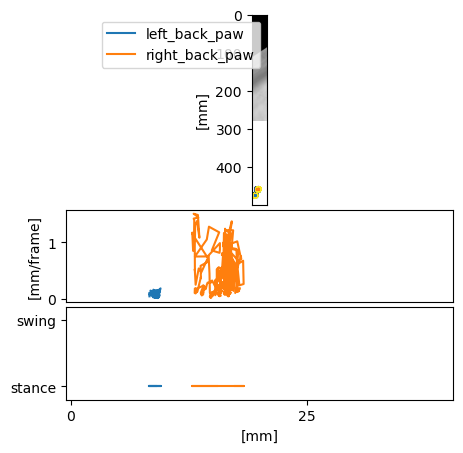

100%|██████████| 56137/56137 [00:00<00:00, 251227.45it/s]


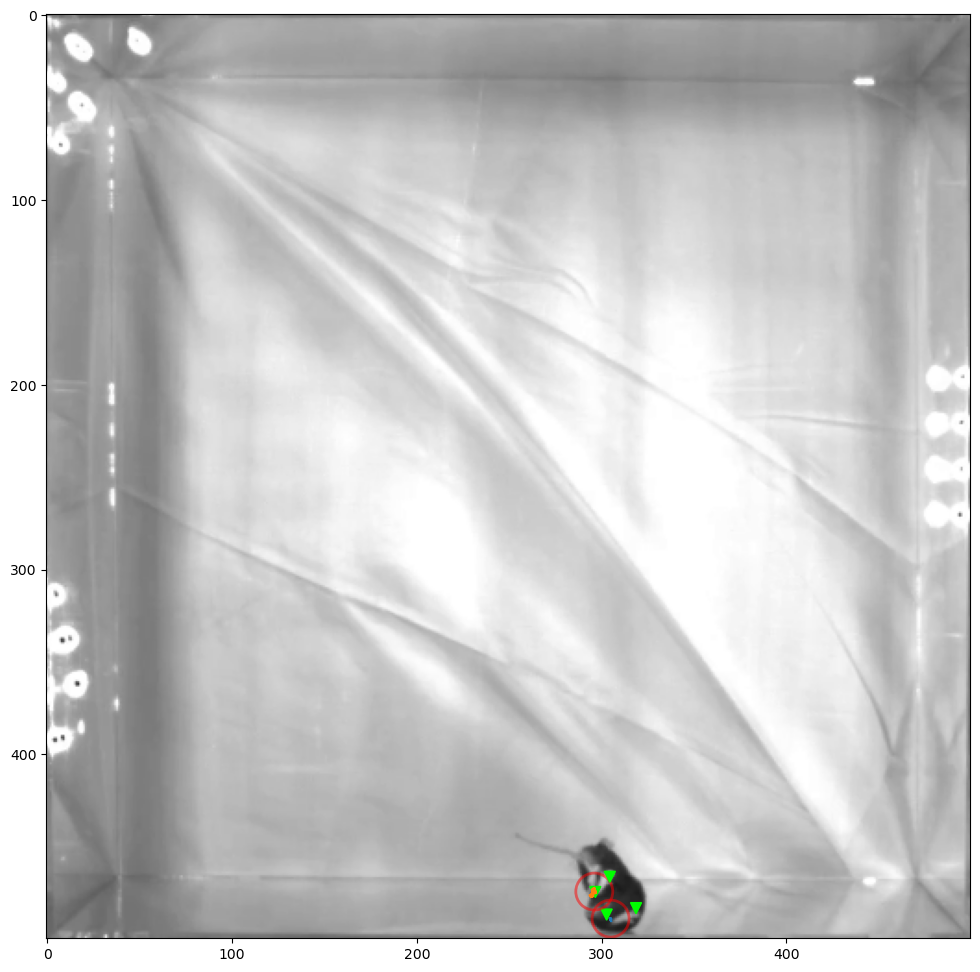

Video 3/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3013/3013 [00:11<00:00, 272.39it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m01_recording2, steps: 644 -- left_back_paw, stride-length: 4.39 +/- 2.57, duration: 11.77 +/- 7.66


100%|██████████| 3059/3059 [00:10<00:00, 280.87it/s]


m01_recording2, steps: 649 -- right_back_paw, stride-length: 4.55 +/- 2.50, duration: 13.87 +/- 7.56


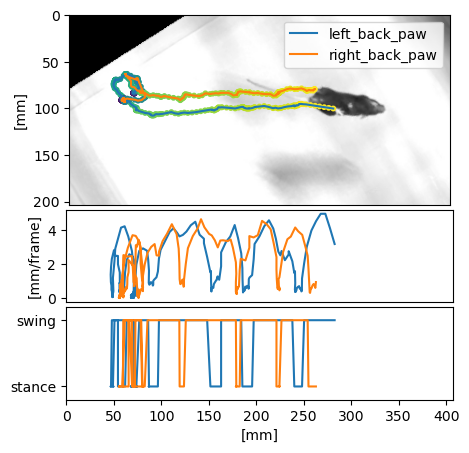

100%|██████████| 65143/65143 [00:00<00:00, 250424.40it/s]


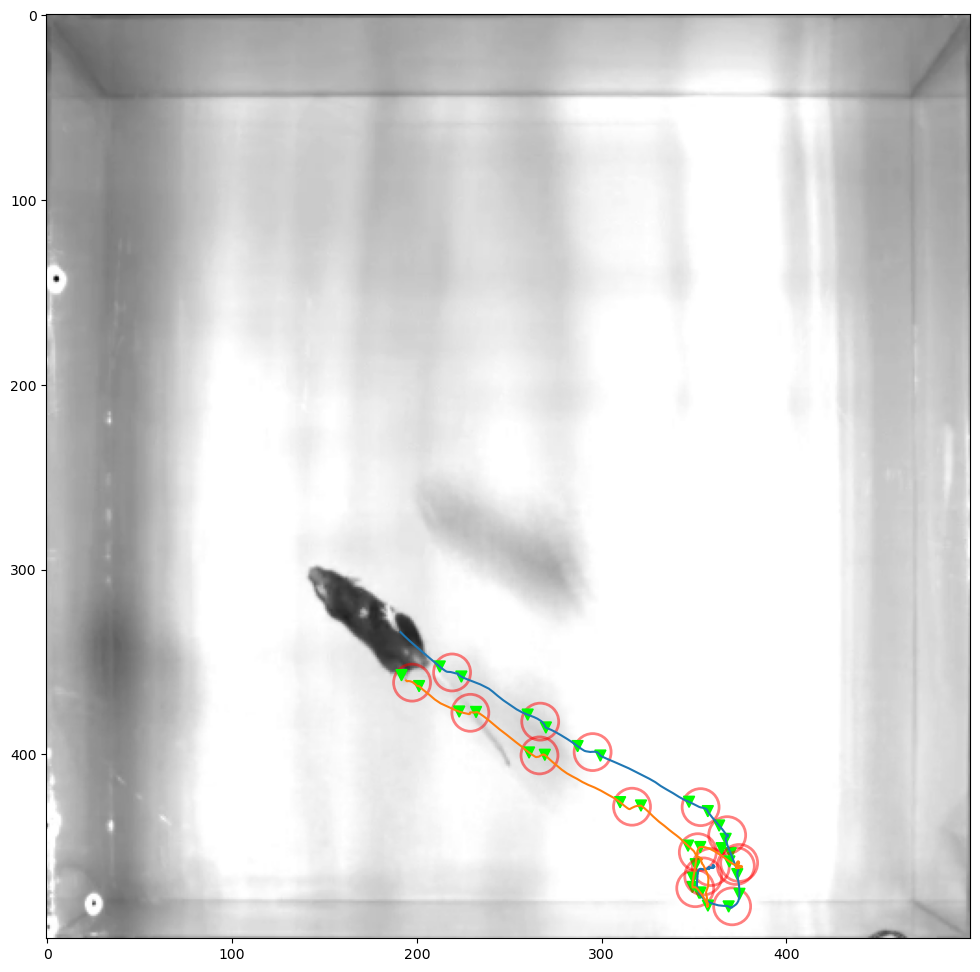

Video 4/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2123/2123 [00:07<00:00, 273.86it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m01_recording3, steps: 422 -- left_back_paw, stride-length: 4.91 +/- 2.77, duration: 12.63 +/- 8.02


100%|██████████| 2285/2285 [00:08<00:00, 277.07it/s]


m01_recording3, steps: 444 -- right_back_paw, stride-length: 4.78 +/- 2.62, duration: 14.25 +/- 8.31


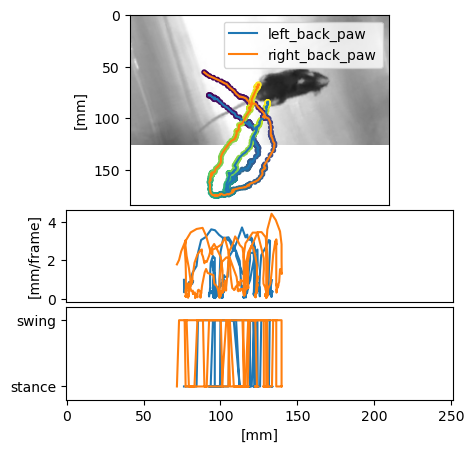

100%|██████████| 66000/66000 [00:00<00:00, 260305.35it/s]


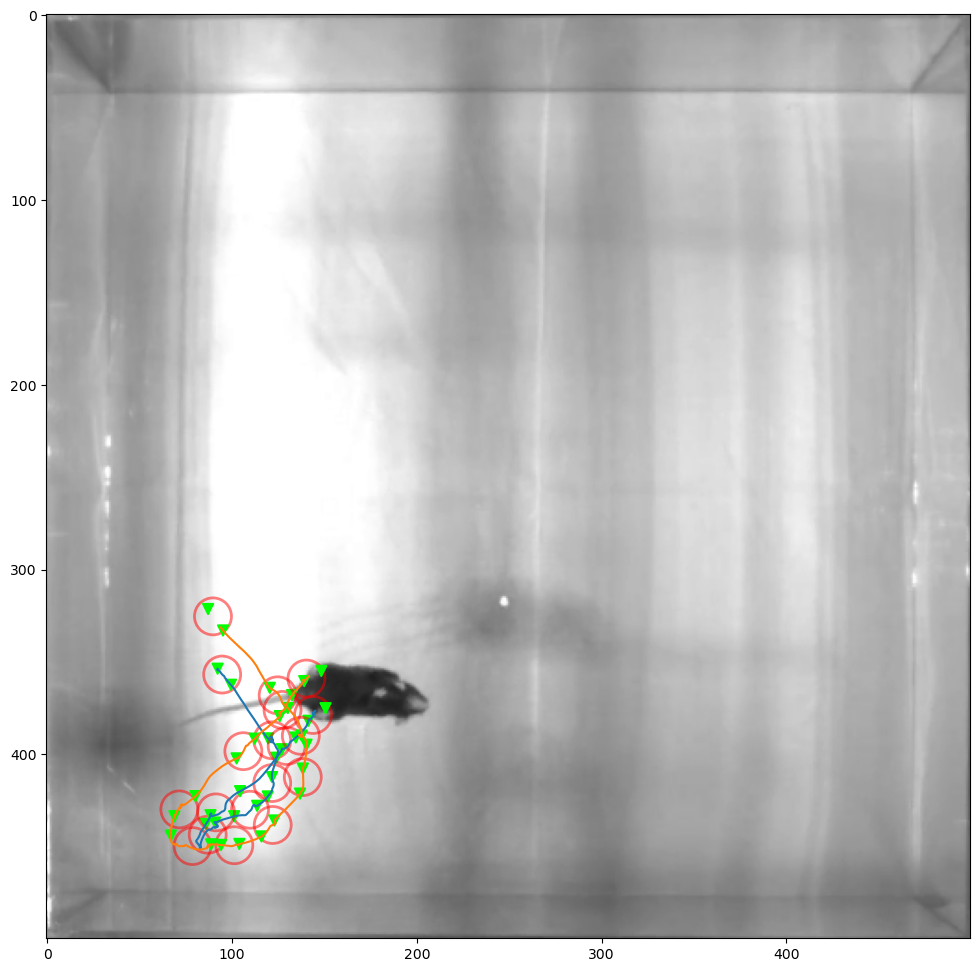

Video 5/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3325/3325 [00:12<00:00, 276.31it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m03_baseline, steps: 799 -- left_back_paw, stride-length: 3.85 +/- 2.29, duration: 10.33 +/- 7.09


100%|██████████| 3369/3369 [00:12<00:00, 270.28it/s]


m03_baseline, steps: 754 -- right_back_paw, stride-length: 3.88 +/- 2.30, duration: 10.05 +/- 7.13


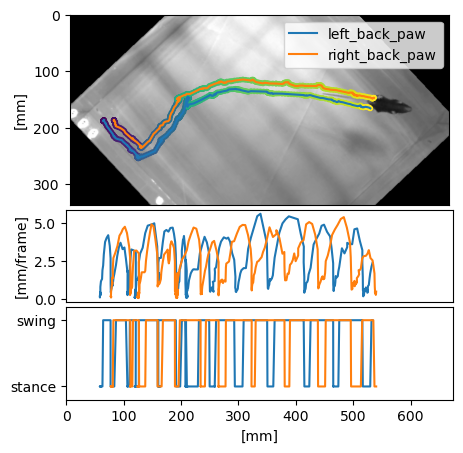

100%|██████████| 65027/65027 [00:00<00:00, 252672.24it/s]


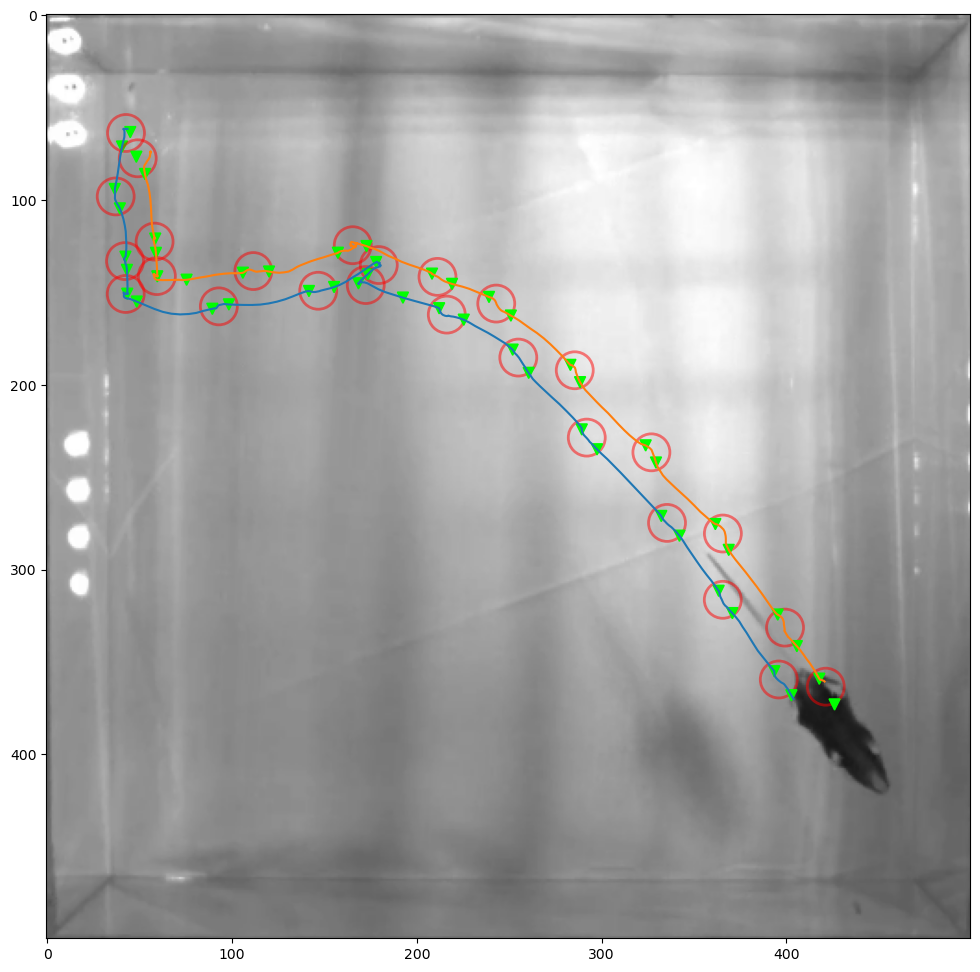

Video 6/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2297/2297 [00:08<00:00, 275.04it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m03_recording1, steps: 486 -- left_back_paw, stride-length: 4.53 +/- 2.51, duration: 12.24 +/- 7.94


100%|██████████| 2295/2295 [00:08<00:00, 269.96it/s]


m03_recording1, steps: 467 -- right_back_paw, stride-length: 4.51 +/- 2.74, duration: 11.18 +/- 7.71


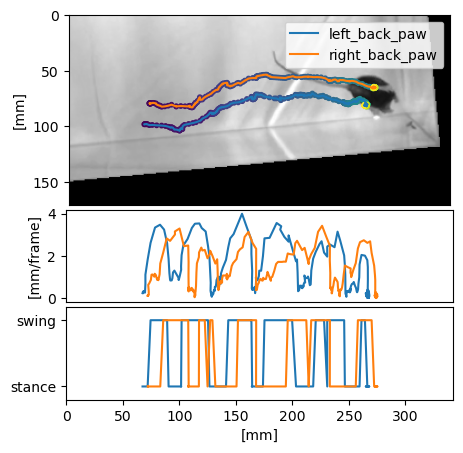

100%|██████████| 63821/63821 [00:00<00:00, 255404.57it/s]


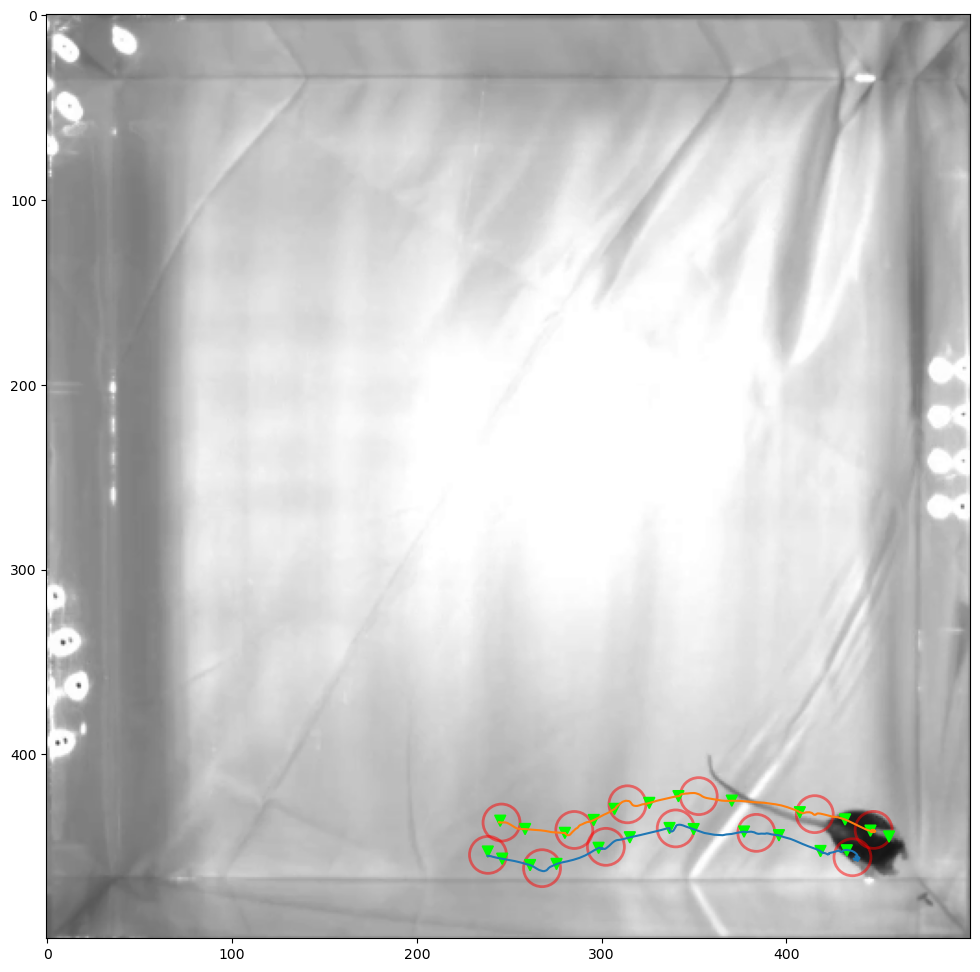

Video 7/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3523/3523 [00:13<00:00, 262.52it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m03_recording2, steps: 777 -- left_back_paw, stride-length: 4.57 +/- 2.52, duration: 11.55 +/- 7.55


100%|██████████| 3471/3471 [00:13<00:00, 264.25it/s]


m03_recording2, steps: 791 -- right_back_paw, stride-length: 4.34 +/- 2.43, duration: 10.97 +/- 7.35


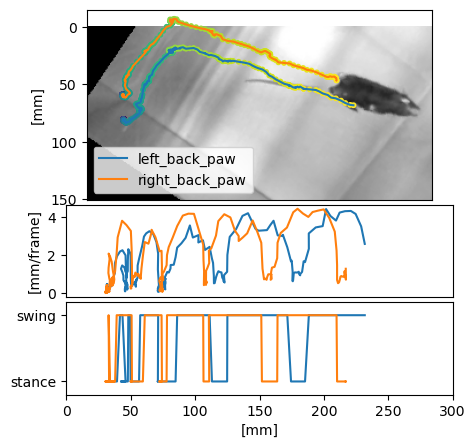

100%|██████████| 65965/65965 [00:00<00:00, 253462.85it/s]


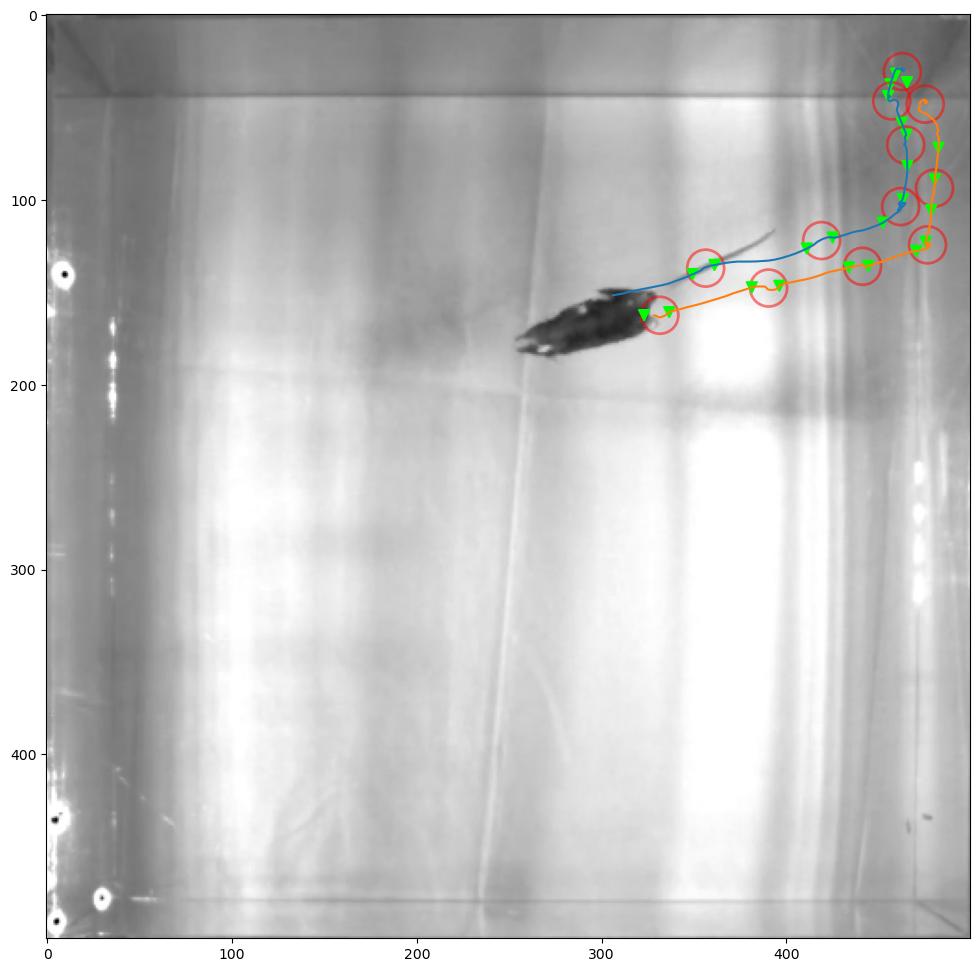

Video 8/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2153/2153 [00:08<00:00, 266.77it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m03_recording3, steps: 467 -- left_back_paw, stride-length: 5.24 +/- 2.81, duration: 12.87 +/- 7.88


100%|██████████| 2137/2137 [00:08<00:00, 263.88it/s]


m03_recording3, steps: 447 -- right_back_paw, stride-length: 5.23 +/- 2.76, duration: 12.21 +/- 7.49


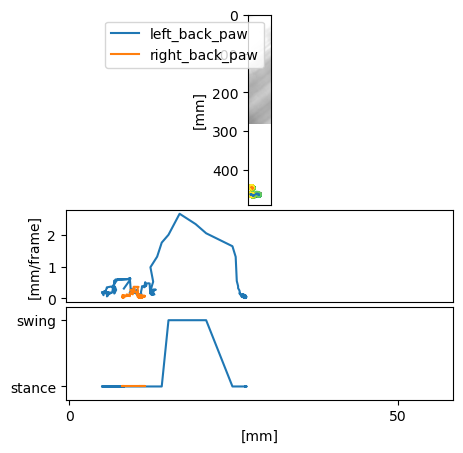

100%|██████████| 64949/64949 [00:00<00:00, 256376.67it/s]


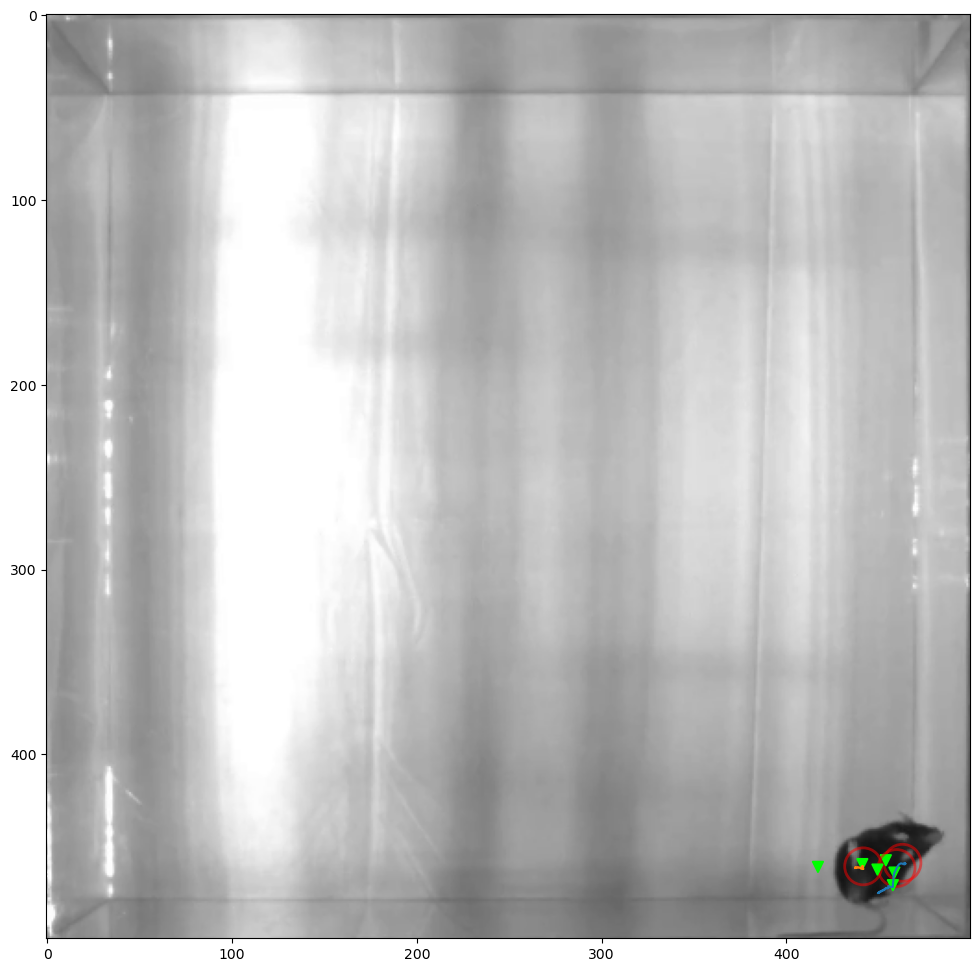

Video 9/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 4181/4181 [00:15<00:00, 274.14it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m05_baseline, steps: 919 -- left_back_paw, stride-length: 3.43 +/- 2.14, duration: 10.32 +/- 7.22


100%|██████████| 3973/3973 [00:14<00:00, 275.28it/s]


m05_baseline, steps: 881 -- right_back_paw, stride-length: 3.55 +/- 2.32, duration: 10.97 +/- 7.36


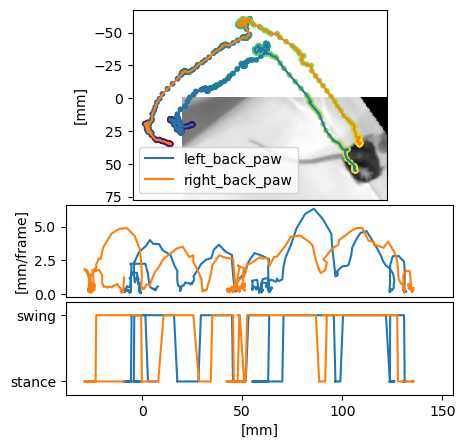

100%|██████████| 64436/64436 [00:00<00:00, 240735.76it/s]


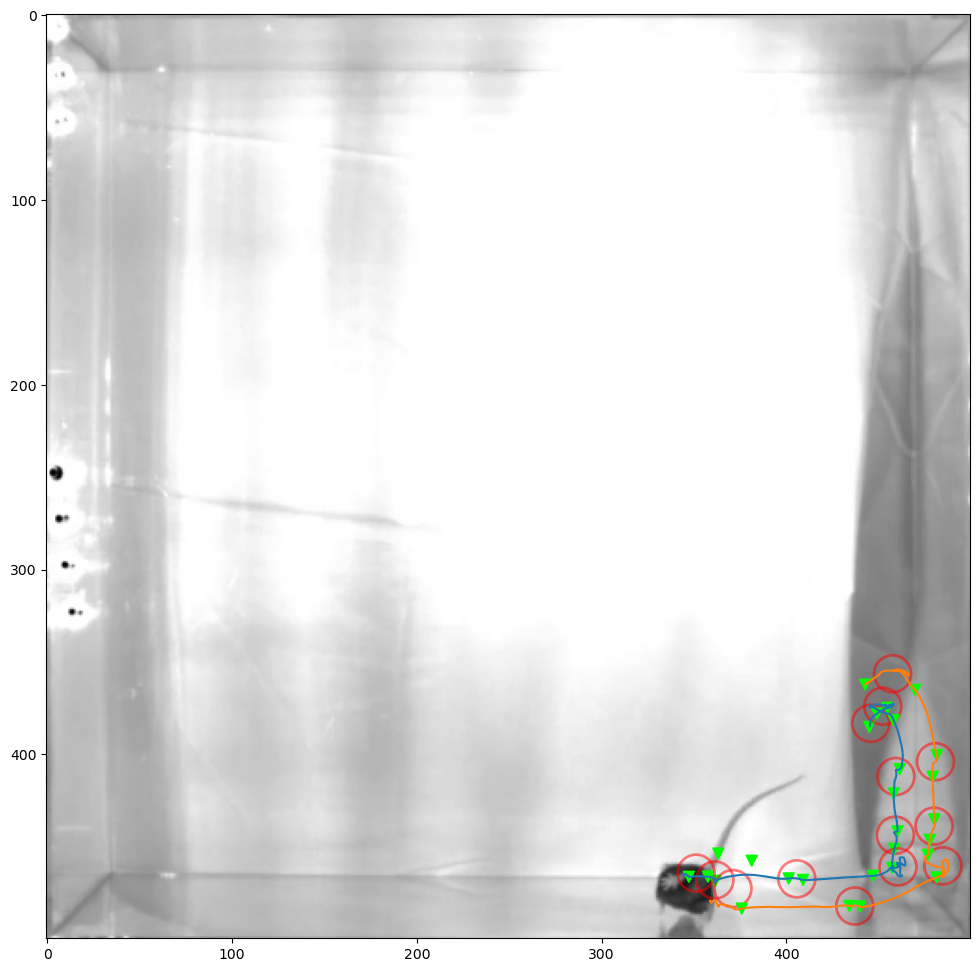

Video 10/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2355/2355 [00:09<00:00, 254.48it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m05_recording1, steps: 435 -- left_back_paw, stride-length: 4.89 +/- 3.10, duration: 11.70 +/- 7.74


100%|██████████| 2459/2459 [00:09<00:00, 255.93it/s]


m05_recording1, steps: 475 -- right_back_paw, stride-length: 4.67 +/- 2.81, duration: 10.65 +/- 7.51


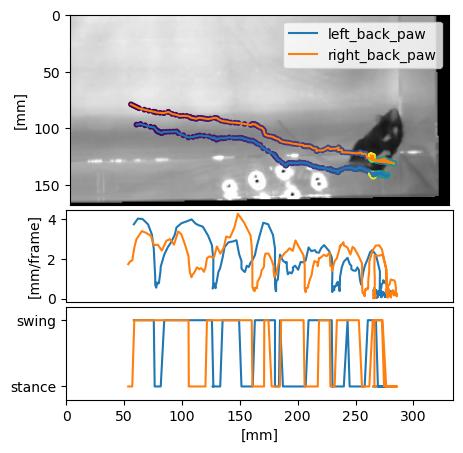

100%|██████████| 65536/65536 [00:00<00:00, 263253.93it/s]


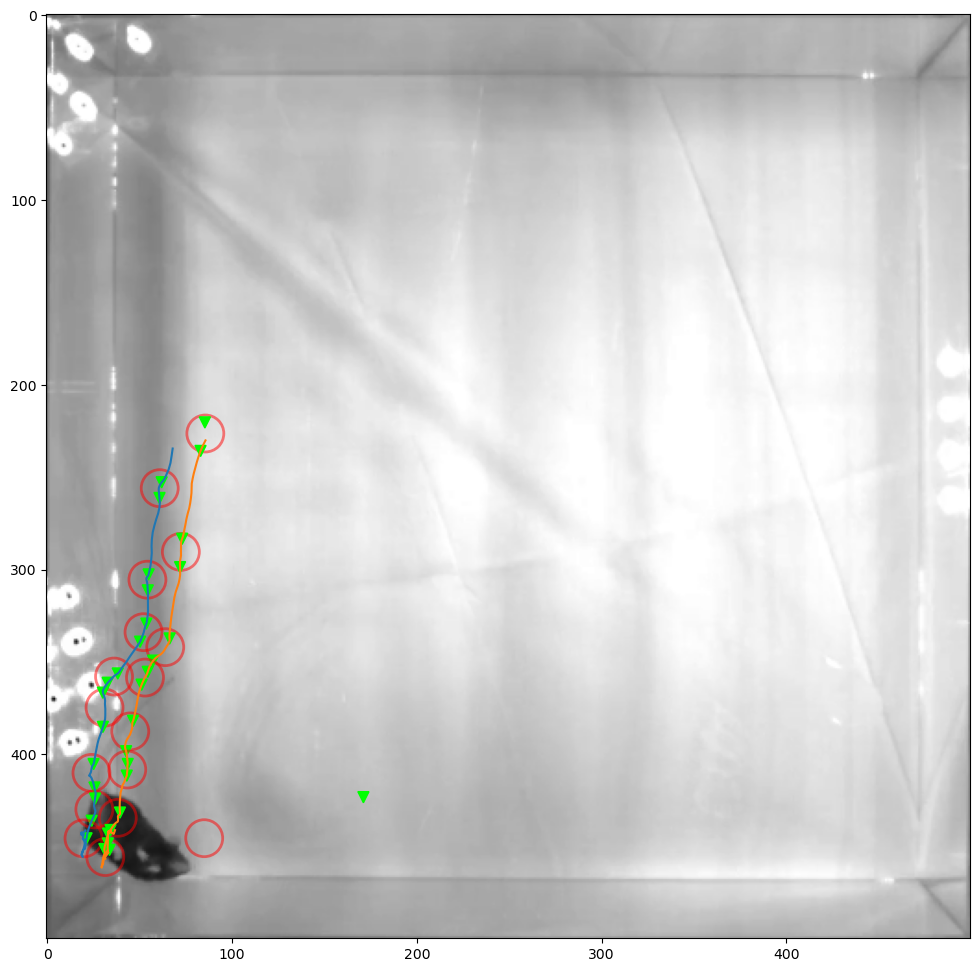

Video 11/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 4175/4175 [00:15<00:00, 265.92it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m05_recording2, steps: 915 -- left_back_paw, stride-length: 3.71 +/- 2.25, duration: 10.58 +/- 7.66


100%|██████████| 4311/4311 [00:16<00:00, 266.34it/s]


m05_recording2, steps: 950 -- right_back_paw, stride-length: 3.62 +/- 2.31, duration: 11.51 +/- 7.98


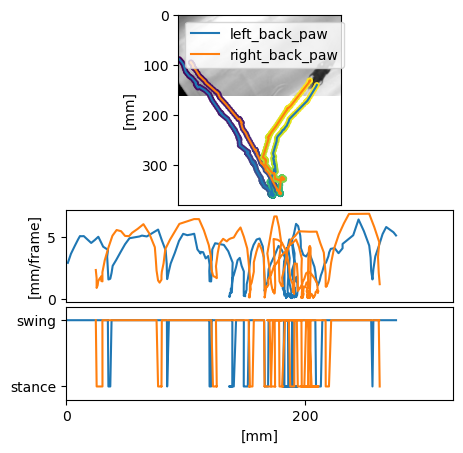

100%|██████████| 66000/66000 [00:00<00:00, 246466.75it/s]


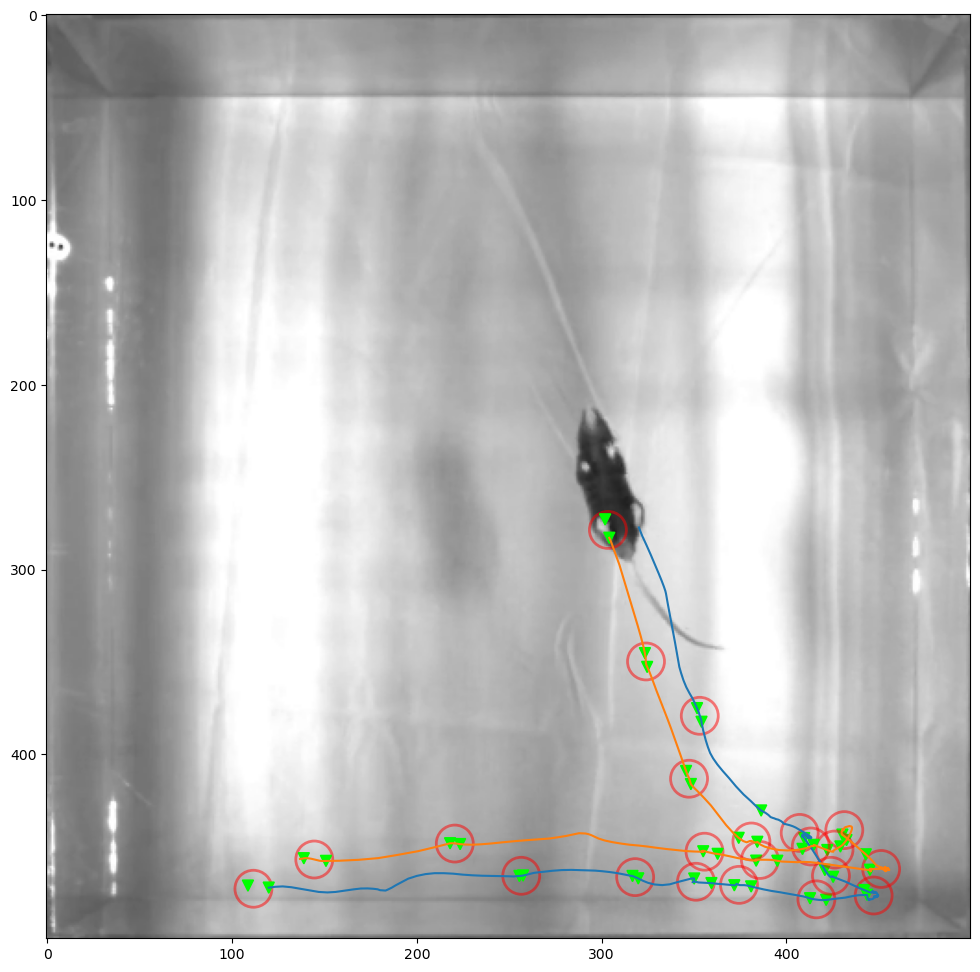

Video 12/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3949/3949 [00:14<00:00, 266.24it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m05_recording3, steps: 825 -- left_back_paw, stride-length: 3.88 +/- 2.30, duration: 10.52 +/- 7.29


100%|██████████| 3759/3759 [00:14<00:00, 266.26it/s]


m05_recording3, steps: 750 -- right_back_paw, stride-length: 4.16 +/- 2.40, duration: 11.70 +/- 7.59


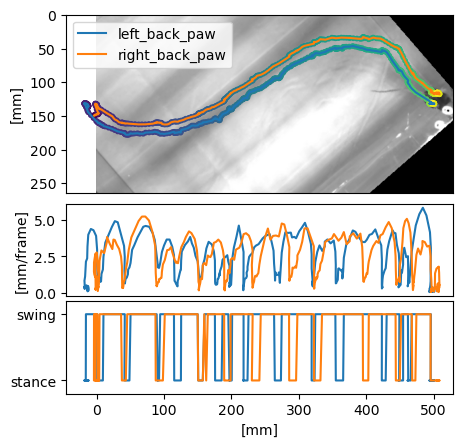

100%|██████████| 66000/66000 [00:00<00:00, 246022.10it/s]


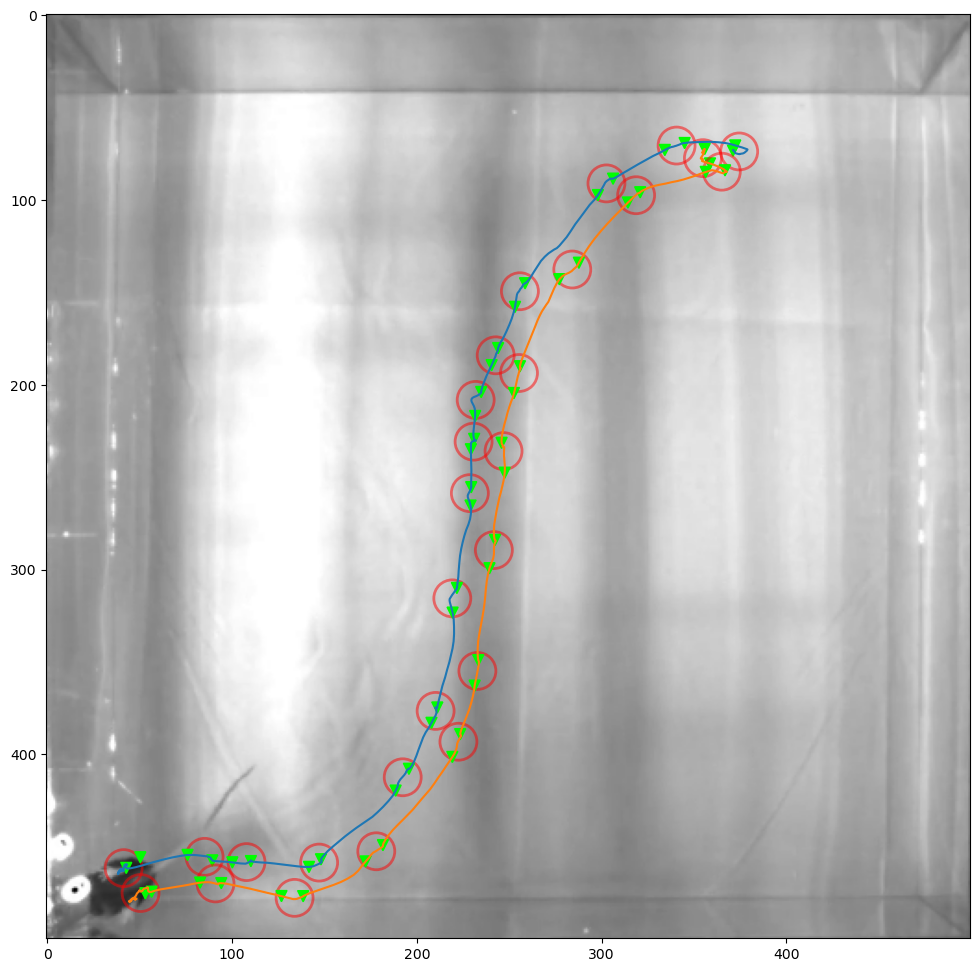

Video 13/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3869/3869 [00:14<00:00, 273.73it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m07_baseline, steps: 872 -- left_back_paw, stride-length: 3.88 +/- 2.40, duration: 11.67 +/- 7.73


100%|██████████| 3689/3689 [00:13<00:00, 268.14it/s]


m07_baseline, steps: 747 -- right_back_paw, stride-length: 4.07 +/- 2.54, duration: 10.99 +/- 7.80


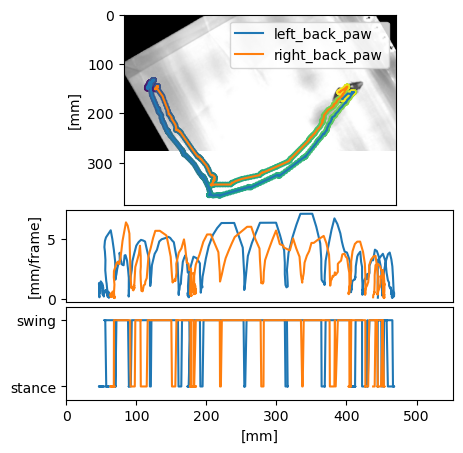

100%|██████████| 64526/64526 [00:00<00:00, 251381.09it/s]


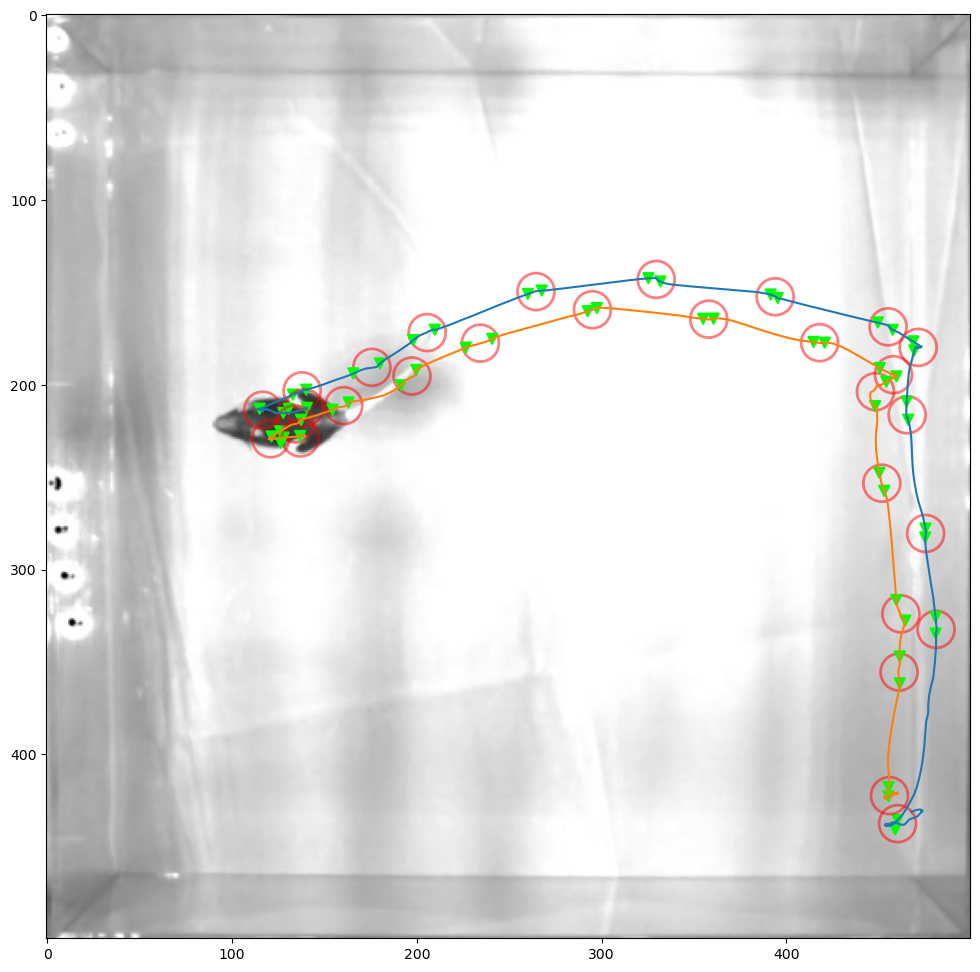

Video 14/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3355/3355 [00:12<00:00, 272.93it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m07_recording1, steps: 786 -- left_back_paw, stride-length: 3.94 +/- 2.38, duration: 12.71 +/- 7.88


100%|██████████| 3311/3311 [00:12<00:00, 266.95it/s]


m07_recording1, steps: 702 -- right_back_paw, stride-length: 4.22 +/- 2.56, duration: 11.30 +/- 7.76


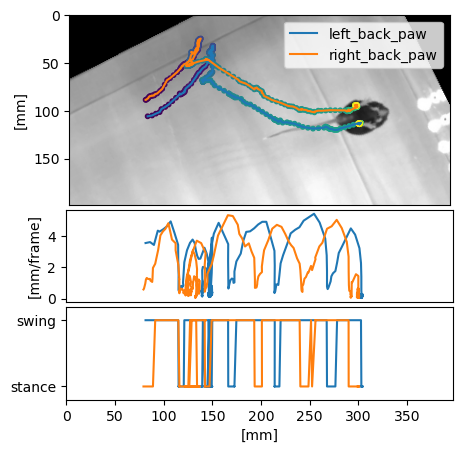

100%|██████████| 65717/65717 [00:00<00:00, 249506.51it/s]


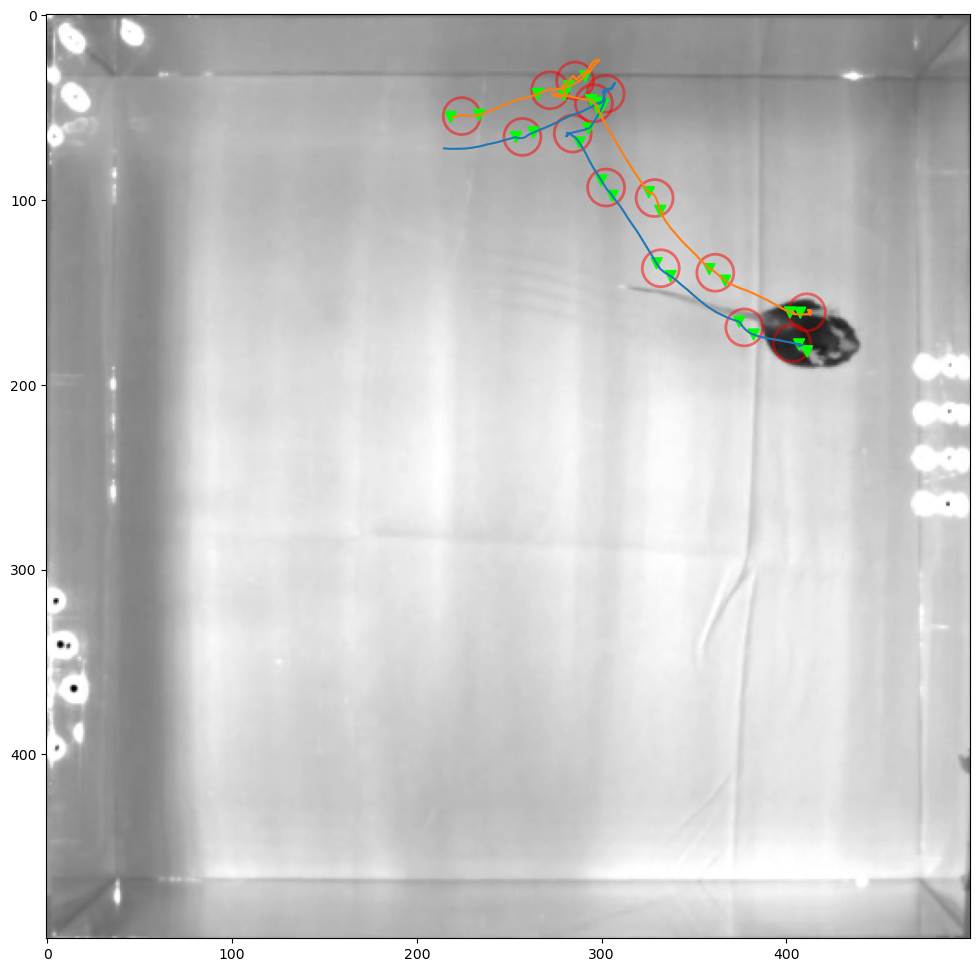

Video 15/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3361/3361 [00:12<00:00, 269.38it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m07_recording2, steps: 752 -- left_back_paw, stride-length: 4.27 +/- 2.40, duration: 12.78 +/- 8.07


100%|██████████| 3023/3023 [00:11<00:00, 268.11it/s]


m07_recording2, steps: 629 -- right_back_paw, stride-length: 4.58 +/- 2.66, duration: 12.22 +/- 8.12


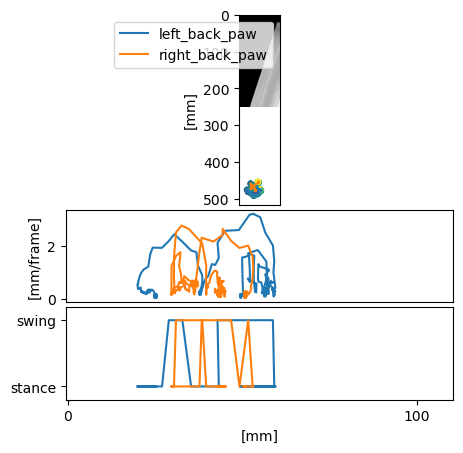

100%|██████████| 66000/66000 [00:00<00:00, 254110.41it/s]


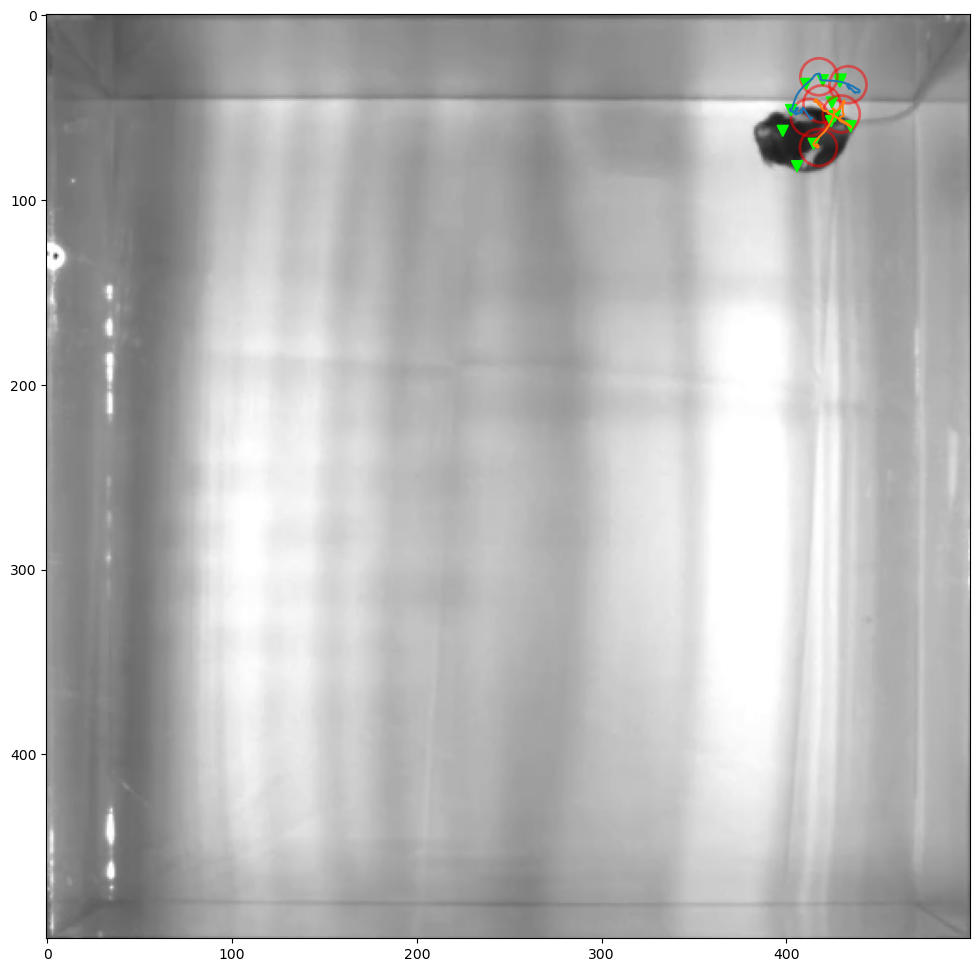

Video 16/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3377/3377 [00:12<00:00, 276.50it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m07_recording3, steps: 732 -- left_back_paw, stride-length: 4.38 +/- 2.46, duration: 13.04 +/- 8.03


100%|██████████| 3435/3435 [00:12<00:00, 274.85it/s]


m07_recording3, steps: 727 -- right_back_paw, stride-length: 4.51 +/- 2.68, duration: 11.58 +/- 8.09


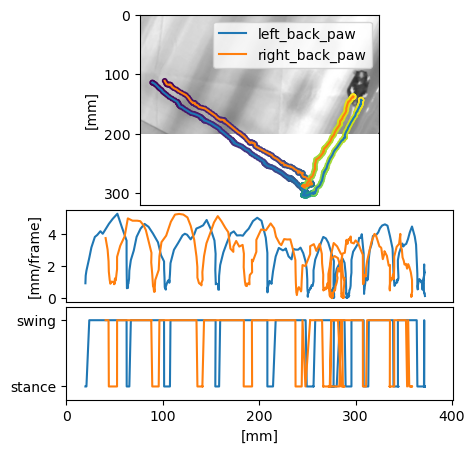

100%|██████████| 63809/63809 [00:00<00:00, 252987.15it/s]


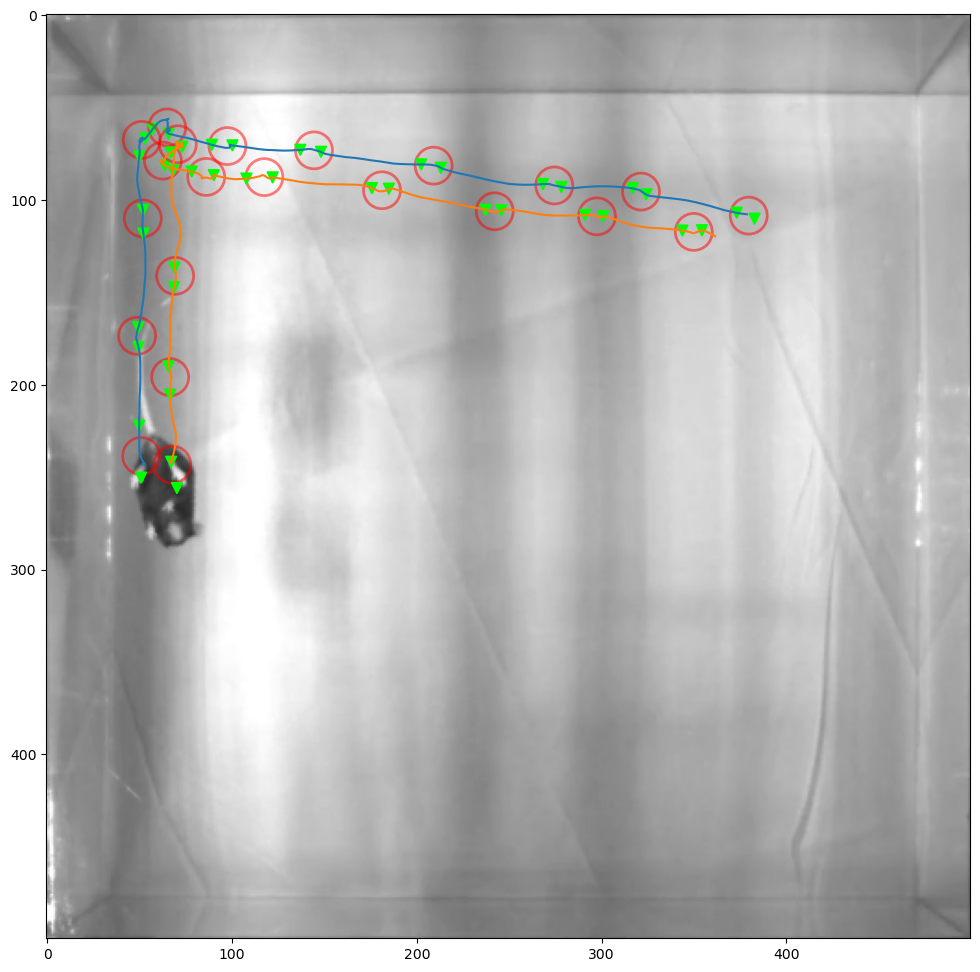

Video 17/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3745/3745 [00:13<00:00, 273.02it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m13_baseline, steps: 853 -- left_back_paw, stride-length: 3.97 +/- 2.37, duration: 10.73 +/- 7.15


100%|██████████| 4033/4033 [00:14<00:00, 270.67it/s]


m13_baseline, steps: 884 -- right_back_paw, stride-length: 4.03 +/- 2.40, duration: 11.28 +/- 7.58


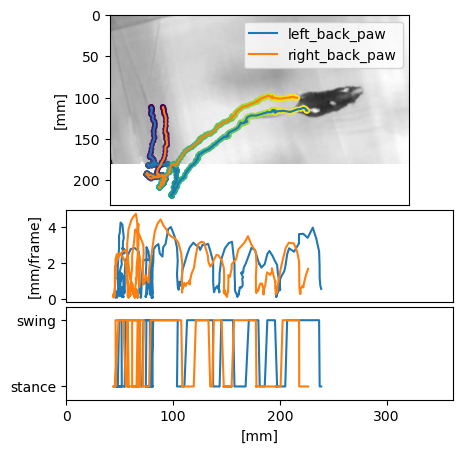

100%|██████████| 64908/64908 [00:00<00:00, 246025.44it/s]


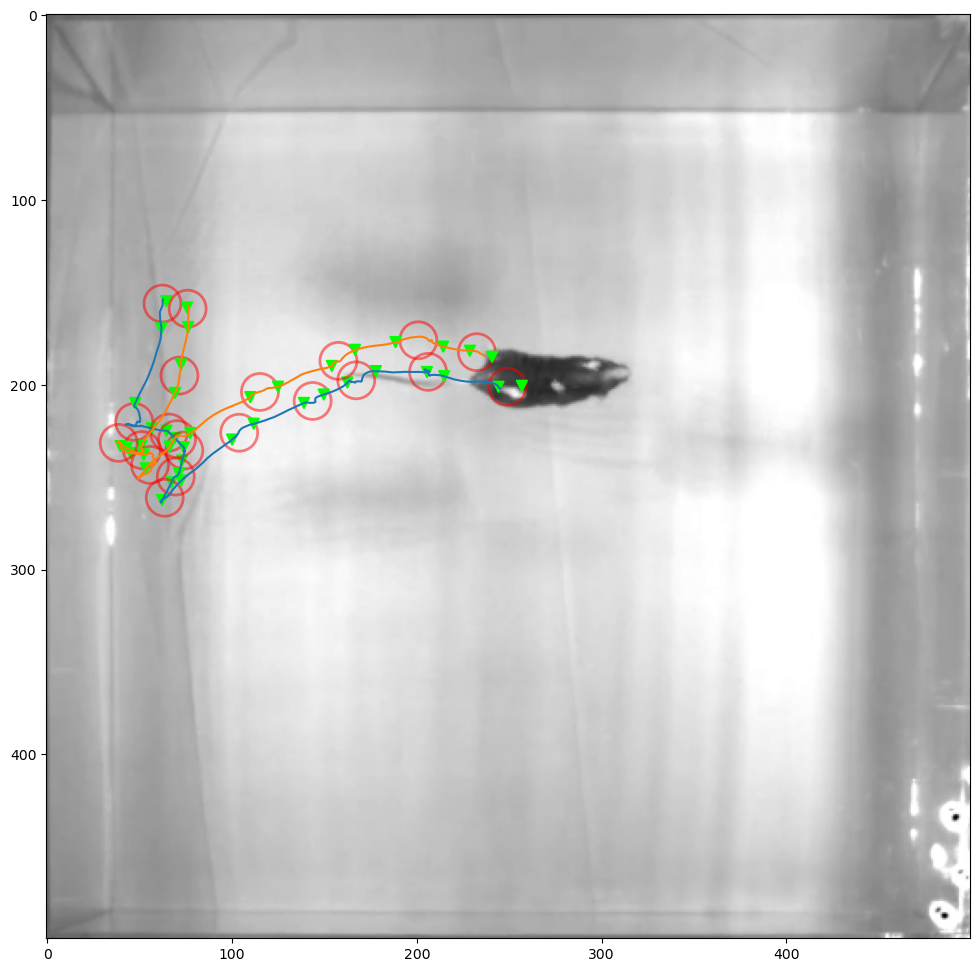

Video 18/32
DID NOT FIND DLC FILE!
Video 19/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2309/2309 [00:08<00:00, 269.28it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m13_recording2, steps: 450 -- left_back_paw, stride-length: 4.68 +/- 2.53, duration: 13.05 +/- 7.60


100%|██████████| 2267/2267 [00:08<00:00, 268.10it/s]


m13_recording2, steps: 409 -- right_back_paw, stride-length: 5.12 +/- 2.95, duration: 13.22 +/- 8.06


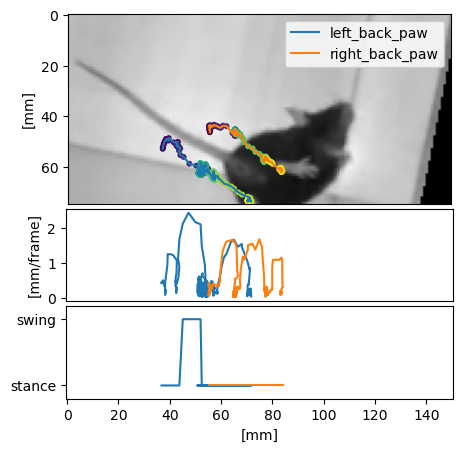

100%|██████████| 66000/66000 [00:00<00:00, 256910.42it/s]


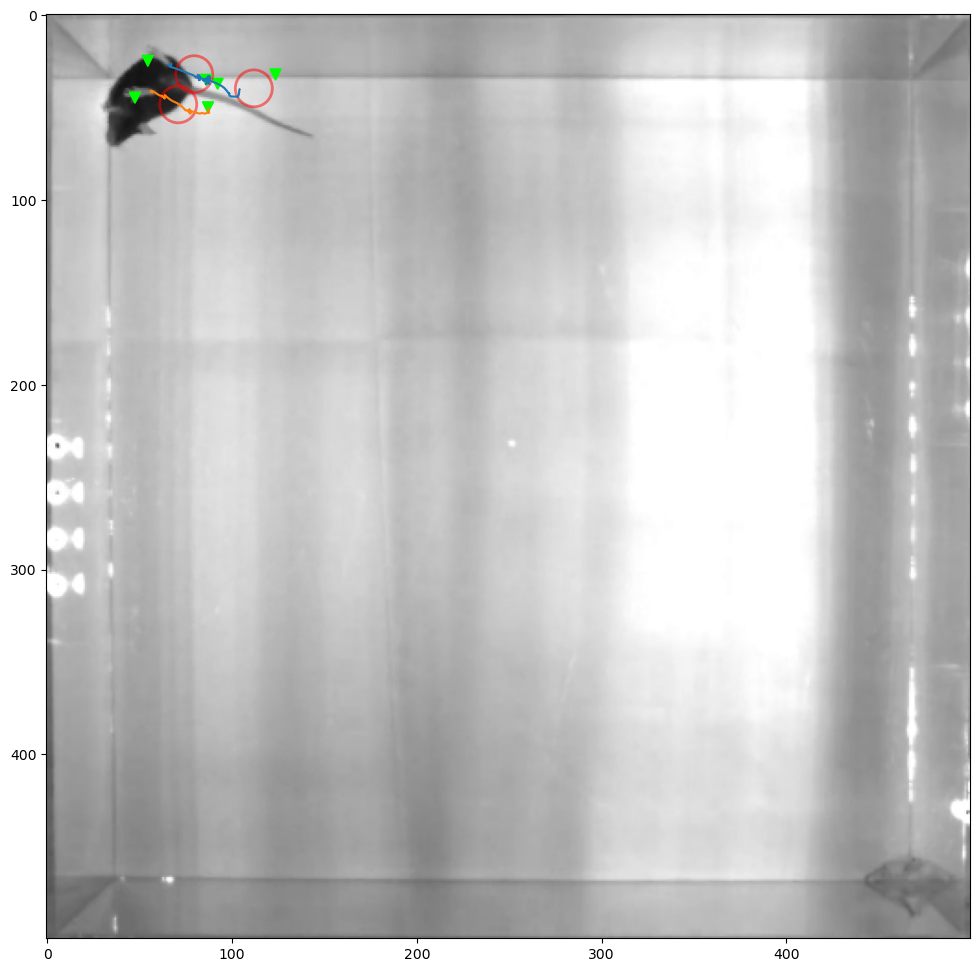

Video 20/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3351/3351 [00:12<00:00, 265.63it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m13_recording3, steps: 682 -- left_back_paw, stride-length: 4.51 +/- 2.56, duration: 12.32 +/- 7.62


100%|██████████| 3341/3341 [00:12<00:00, 270.16it/s]


m13_recording3, steps: 704 -- right_back_paw, stride-length: 4.67 +/- 2.51, duration: 12.91 +/- 7.99


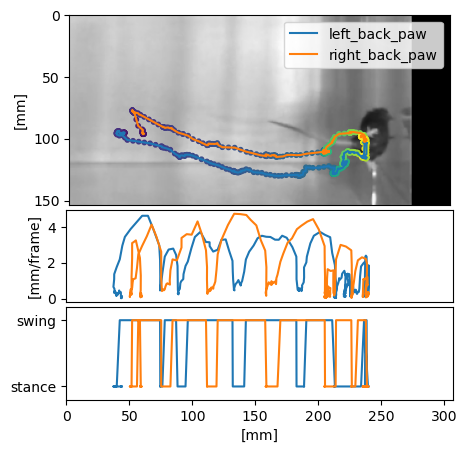

100%|██████████| 66000/66000 [00:00<00:00, 249526.83it/s]


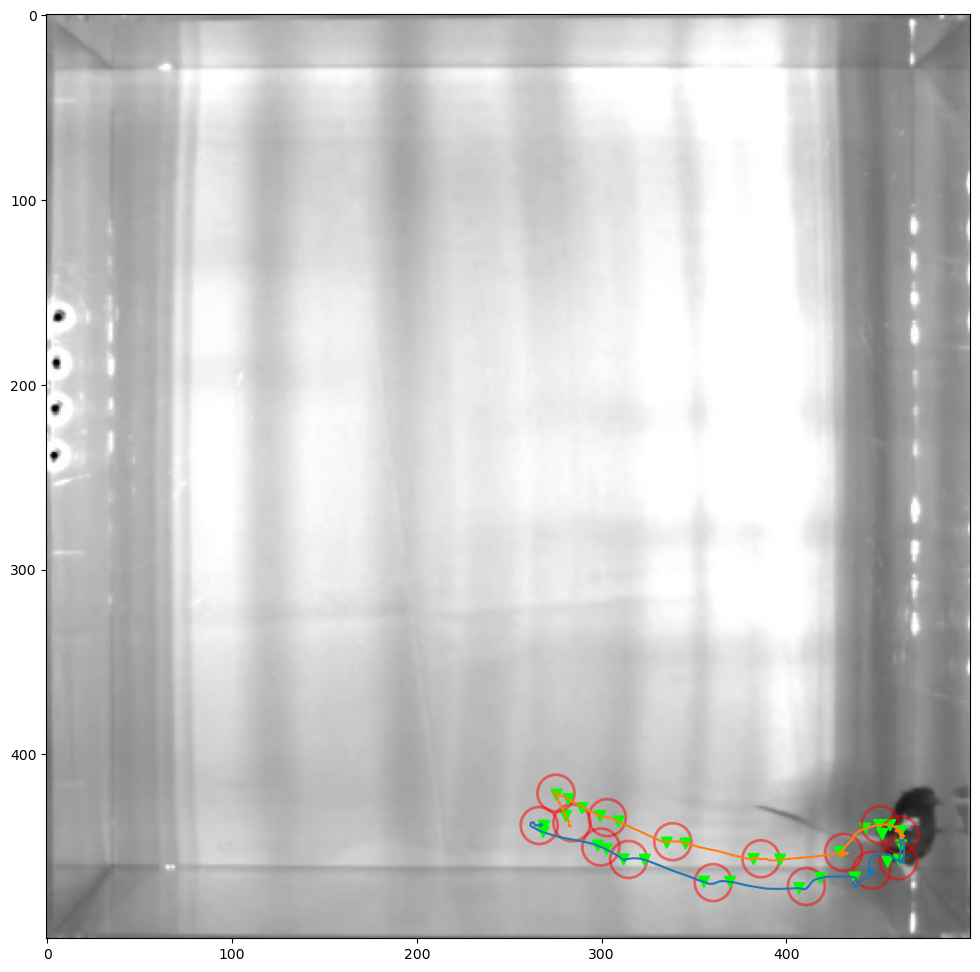

Video 21/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3117/3117 [00:11<00:00, 268.71it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m15_baseline, steps: 728 -- left_back_paw, stride-length: 3.95 +/- 2.29, duration: 11.26 +/- 7.03


100%|██████████| 3411/3411 [00:12<00:00, 275.12it/s]


m15_baseline, steps: 821 -- right_back_paw, stride-length: 3.91 +/- 2.39, duration: 11.45 +/- 7.07


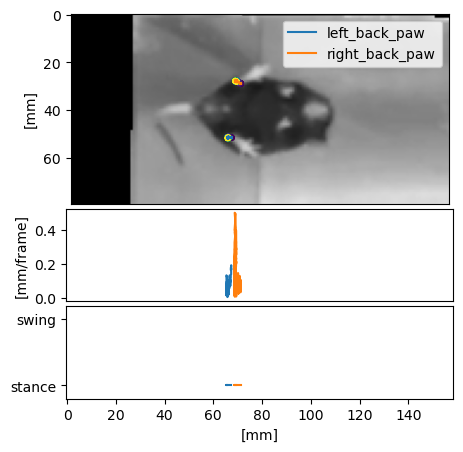

100%|██████████| 66000/66000 [00:00<00:00, 246181.59it/s]


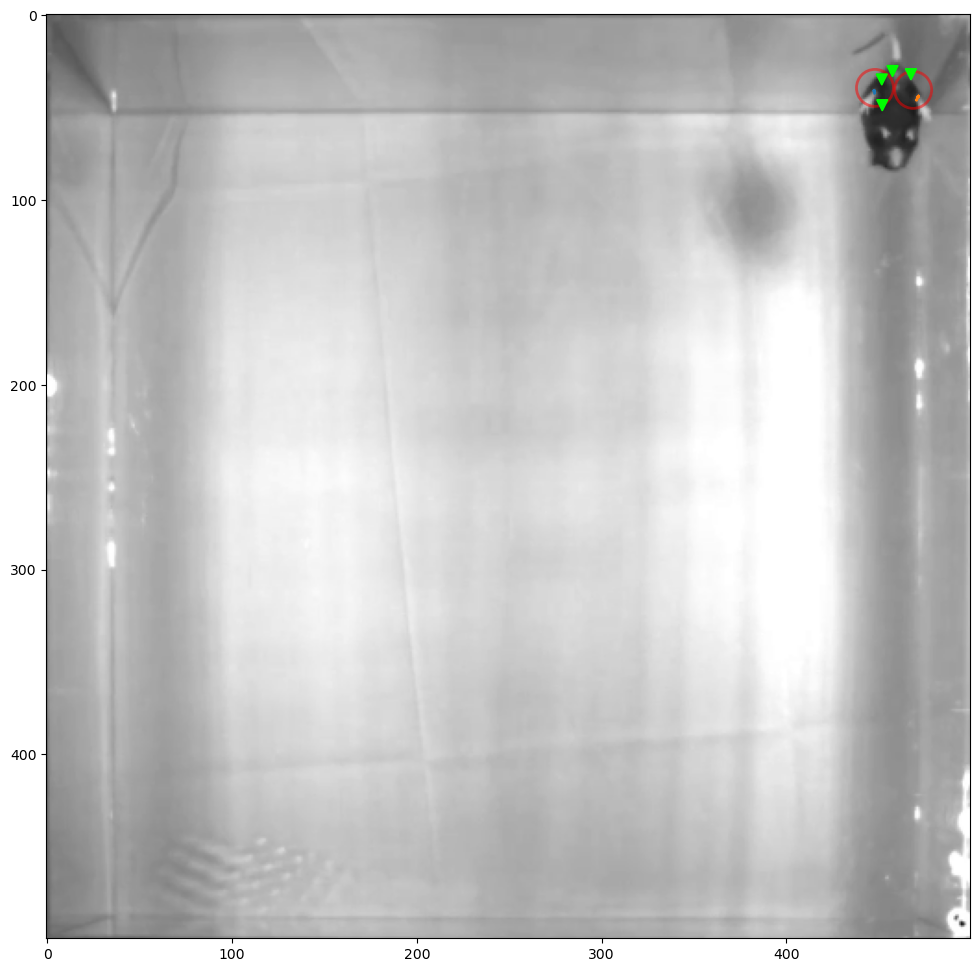

Video 22/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2925/2925 [00:10<00:00, 269.43it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m15_recording1, steps: 666 -- left_back_paw, stride-length: 4.32 +/- 2.34, duration: 11.94 +/- 7.26


100%|██████████| 3091/3091 [00:11<00:00, 273.71it/s]


m15_recording1, steps: 741 -- right_back_paw, stride-length: 4.25 +/- 2.53, duration: 12.30 +/- 7.29


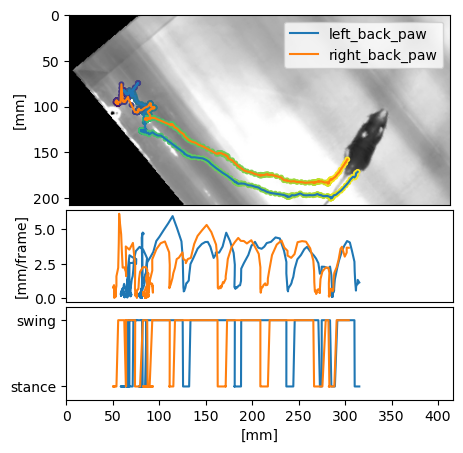

100%|██████████| 65779/65779 [00:00<00:00, 255951.35it/s]


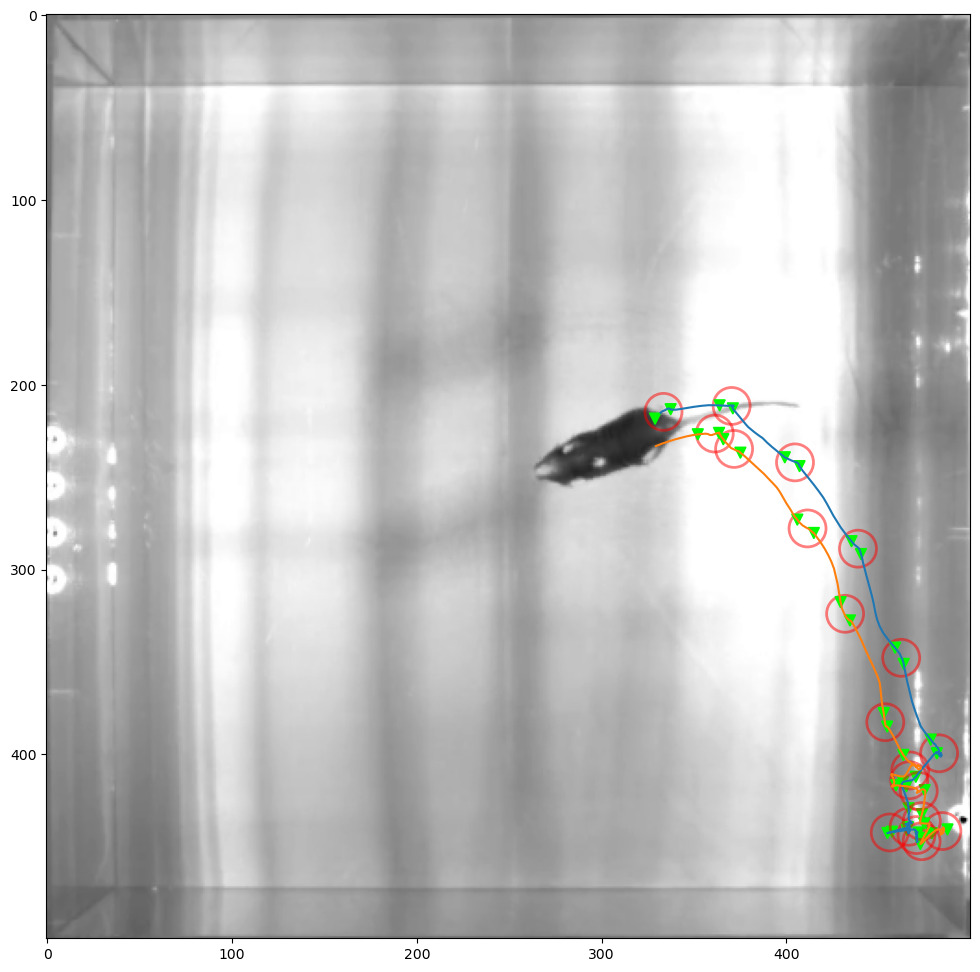

Video 23/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2669/2669 [00:09<00:00, 269.15it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m15_recording2, steps: 577 -- left_back_paw, stride-length: 4.82 +/- 2.45, duration: 12.90 +/- 7.34


100%|██████████| 2739/2739 [00:10<00:00, 268.86it/s]


m15_recording2, steps: 598 -- right_back_paw, stride-length: 4.92 +/- 2.59, duration: 13.04 +/- 7.50


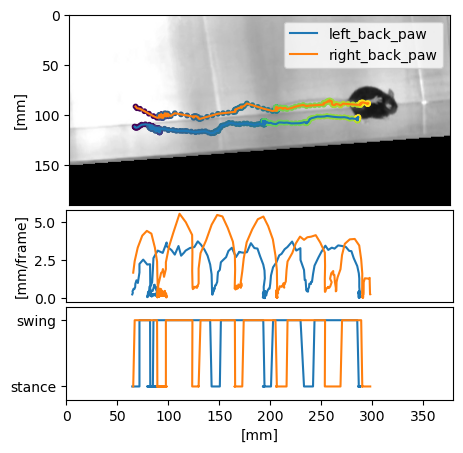

100%|██████████| 66000/66000 [00:00<00:00, 252842.69it/s]


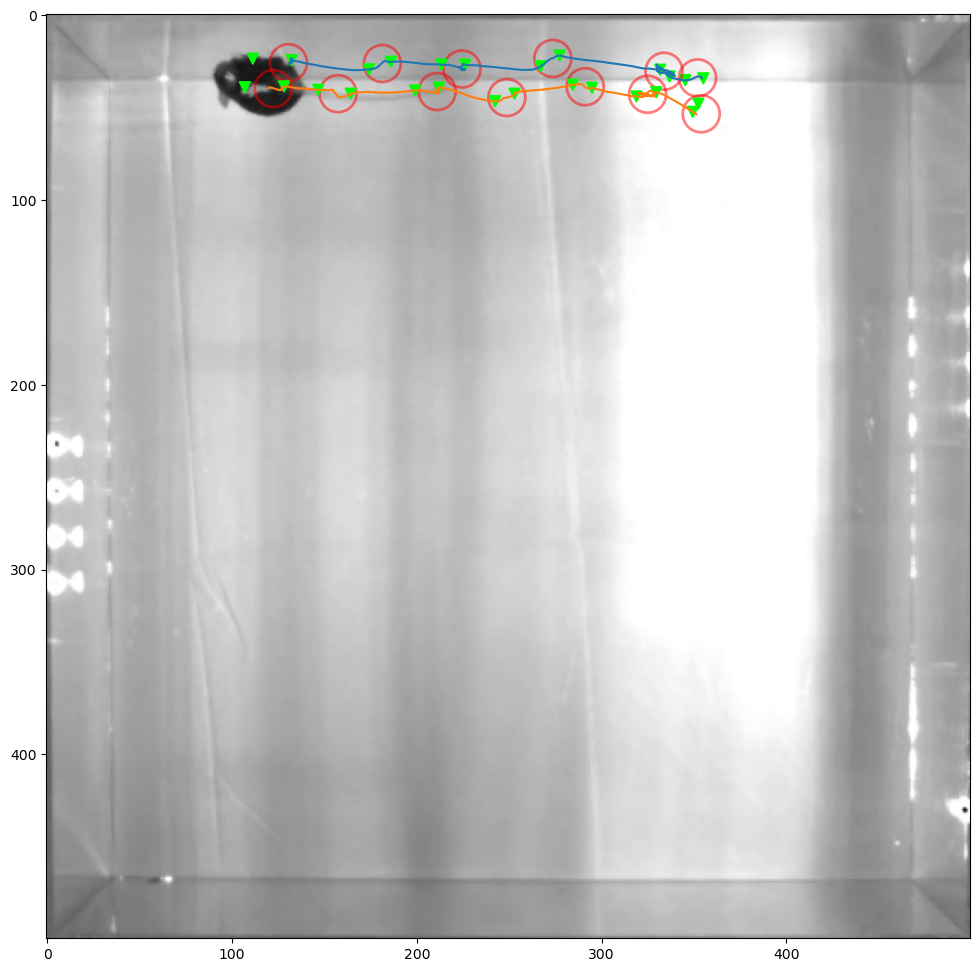

Video 24/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3153/3153 [00:11<00:00, 271.67it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m15_recording3, steps: 691 -- left_back_paw, stride-length: 4.16 +/- 2.41, duration: 11.54 +/- 7.30


100%|██████████| 3081/3081 [00:11<00:00, 273.63it/s]


m15_recording3, steps: 696 -- right_back_paw, stride-length: 4.11 +/- 2.42, duration: 11.88 +/- 7.34


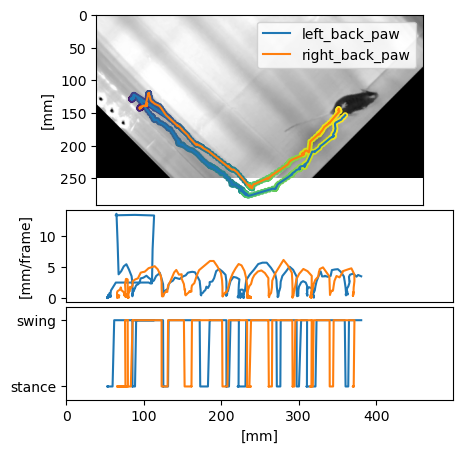

100%|██████████| 65963/65963 [00:00<00:00, 256899.44it/s]


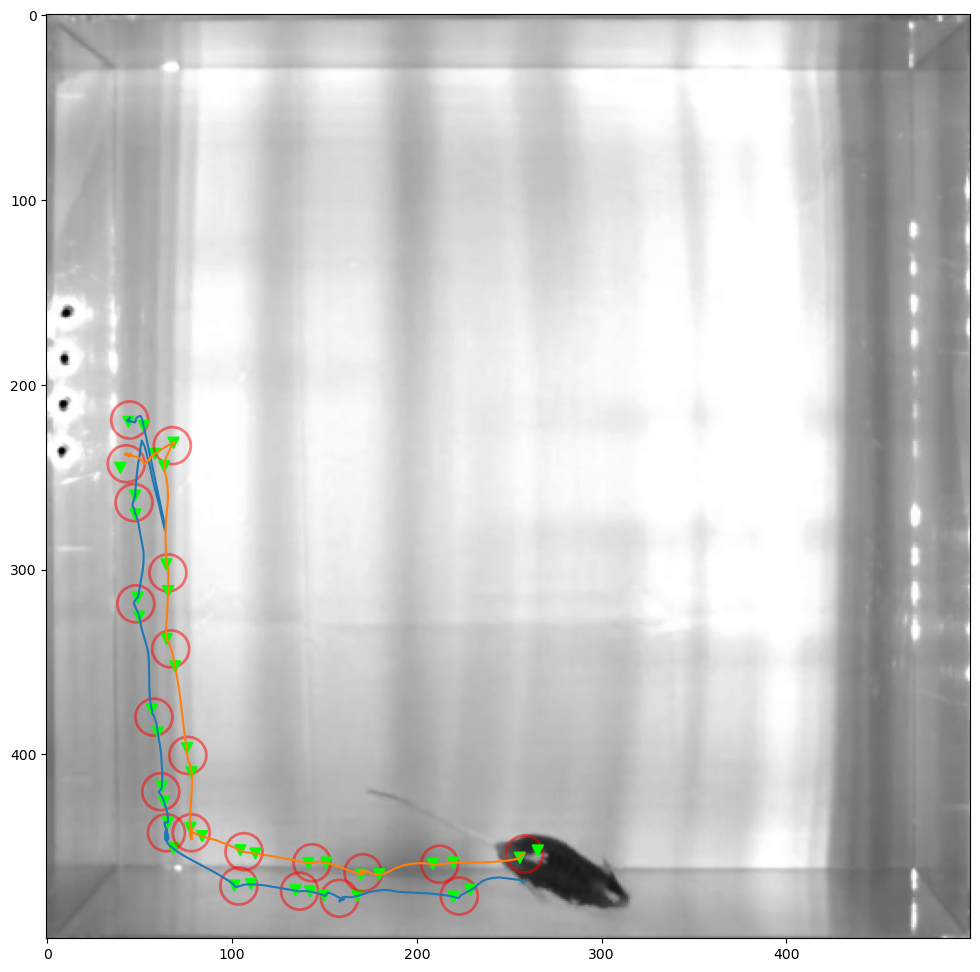

Video 25/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2981/2981 [00:10<00:00, 271.91it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m17_baseline, steps: 694 -- left_back_paw, stride-length: 3.79 +/- 2.25, duration: 11.11 +/- 7.07


100%|██████████| 3313/3313 [00:12<00:00, 271.75it/s]


m17_baseline, steps: 763 -- right_back_paw, stride-length: 3.80 +/- 2.37, duration: 11.60 +/- 7.35


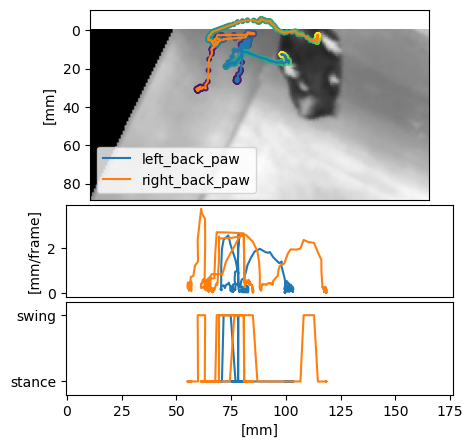

100%|██████████| 65205/65205 [00:00<00:00, 247194.08it/s]


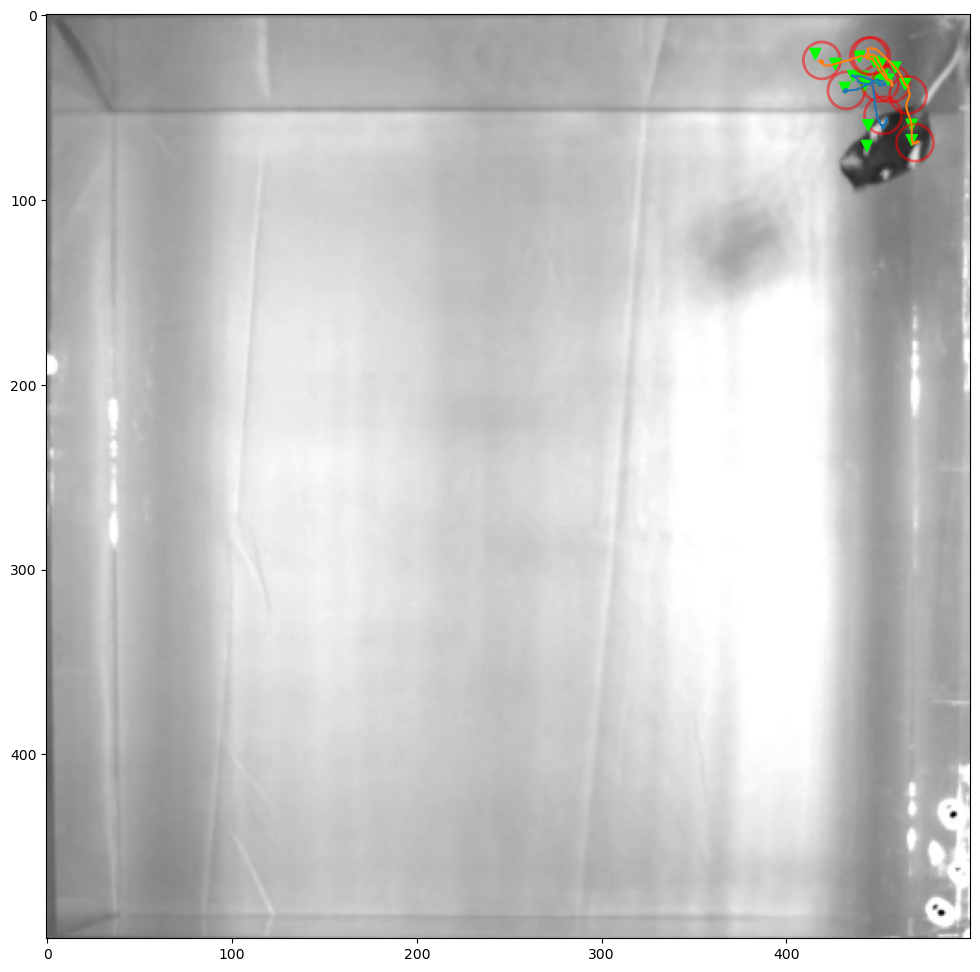

Video 26/32
DID NOT FIND DLC FILE!
Video 27/32
DID NOT FIND DLC FILE!
Video 28/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3035/3035 [00:11<00:00, 272.06it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m17_recording3, steps: 687 -- left_back_paw, stride-length: 3.74 +/- 2.25, duration: 10.84 +/- 6.86


100%|██████████| 3569/3569 [00:13<00:00, 270.61it/s]


m17_recording3, steps: 822 -- right_back_paw, stride-length: 3.51 +/- 2.19, duration: 11.08 +/- 7.25


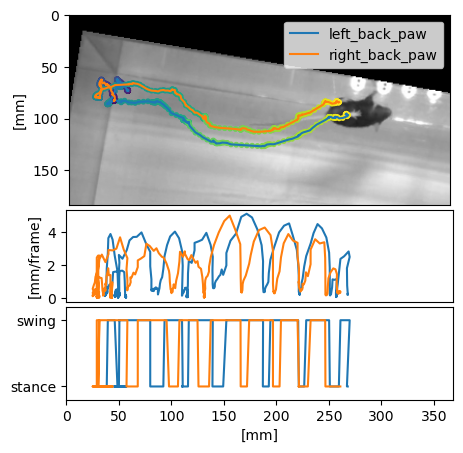

100%|██████████| 65687/65687 [00:00<00:00, 251628.44it/s]


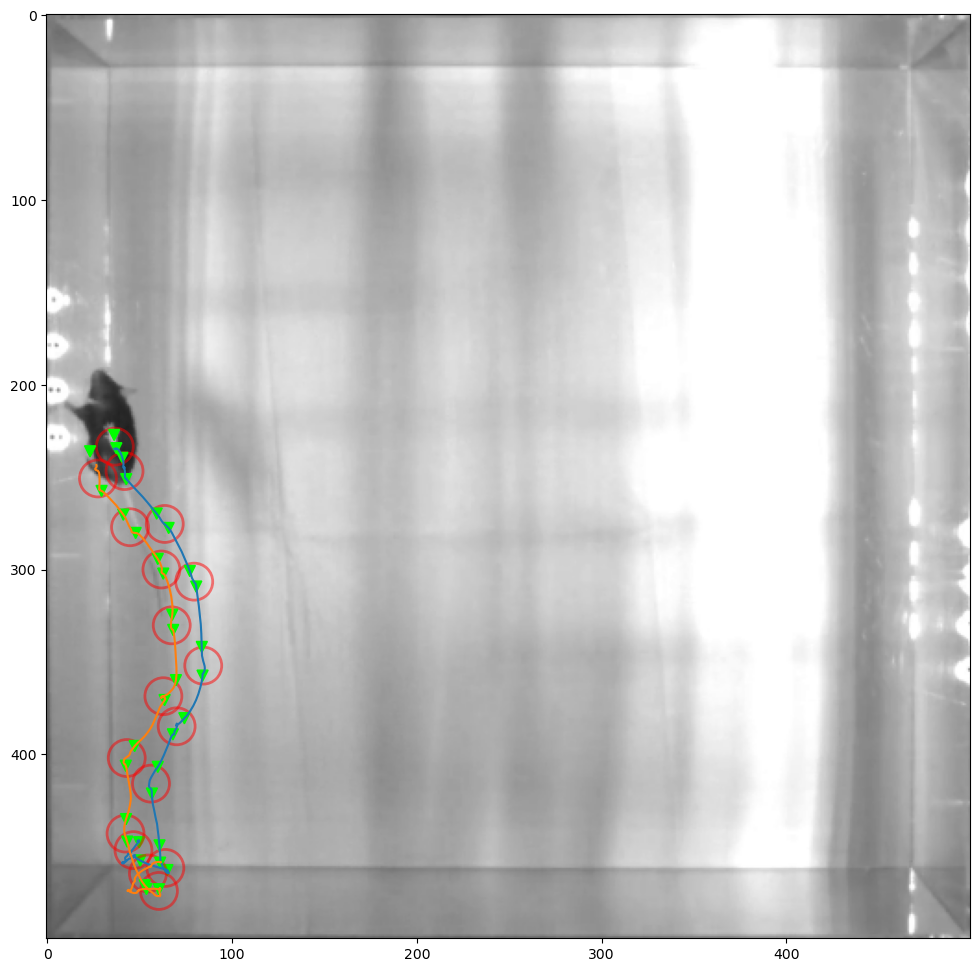

Video 29/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3915/3915 [00:14<00:00, 266.53it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m19_baseline, steps: 838 -- left_back_paw, stride-length: 3.50 +/- 2.11, duration: 10.62 +/- 7.57


100%|██████████| 3947/3947 [00:14<00:00, 268.37it/s]


m19_baseline, steps: 886 -- right_back_paw, stride-length: 3.52 +/- 2.30, duration: 10.62 +/- 7.57


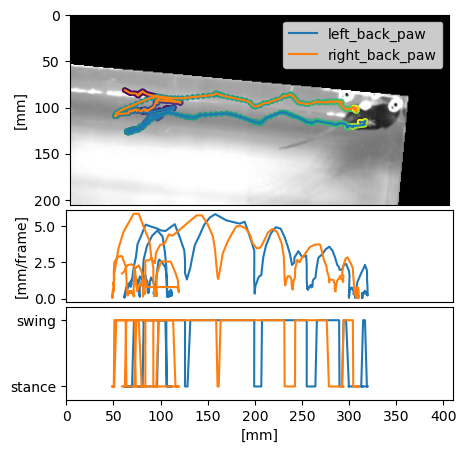

100%|██████████| 65544/65544 [00:00<00:00, 249929.96it/s]


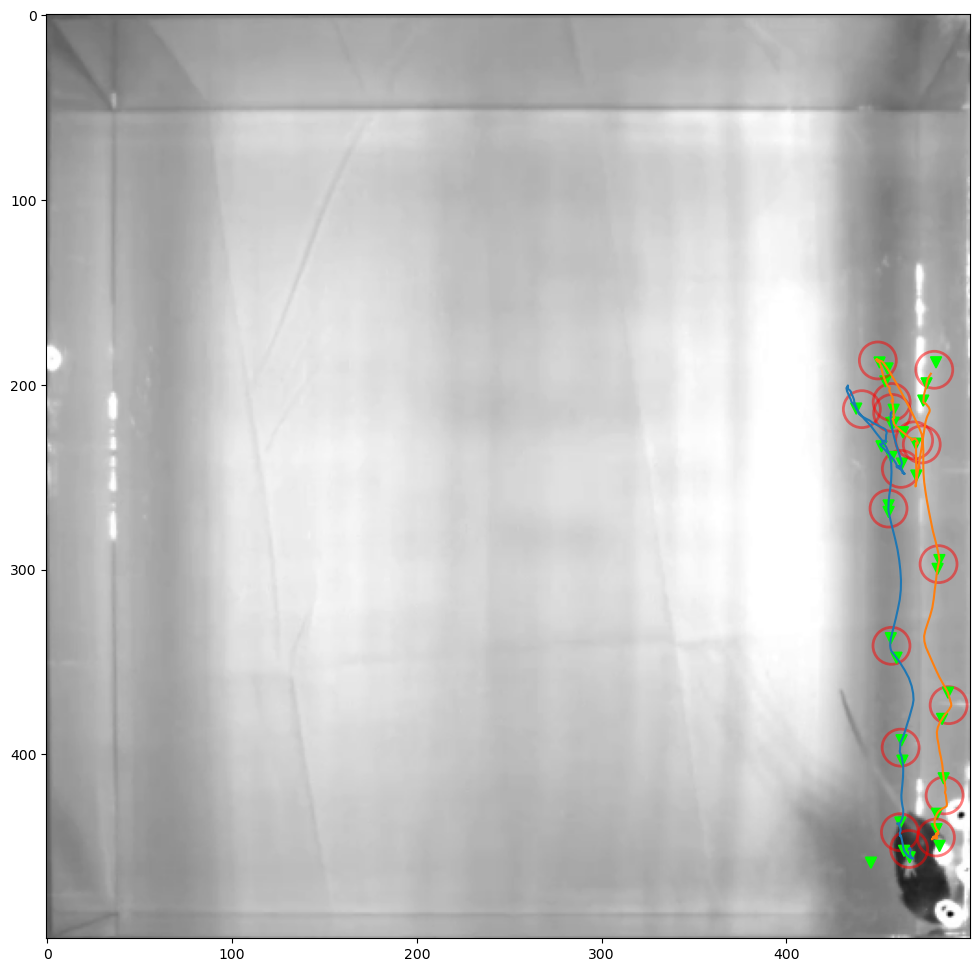

Video 30/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 2795/2795 [00:10<00:00, 266.90it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m19_recording1, steps: 576 -- left_back_paw, stride-length: 4.01 +/- 2.31, duration: 10.33 +/- 7.02


100%|██████████| 2885/2885 [00:10<00:00, 268.58it/s]


m19_recording1, steps: 636 -- right_back_paw, stride-length: 3.94 +/- 2.62, duration: 10.68 +/- 7.61


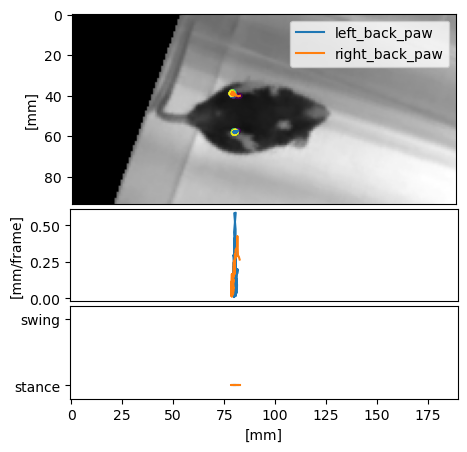

100%|██████████| 66000/66000 [00:00<00:00, 251039.09it/s]


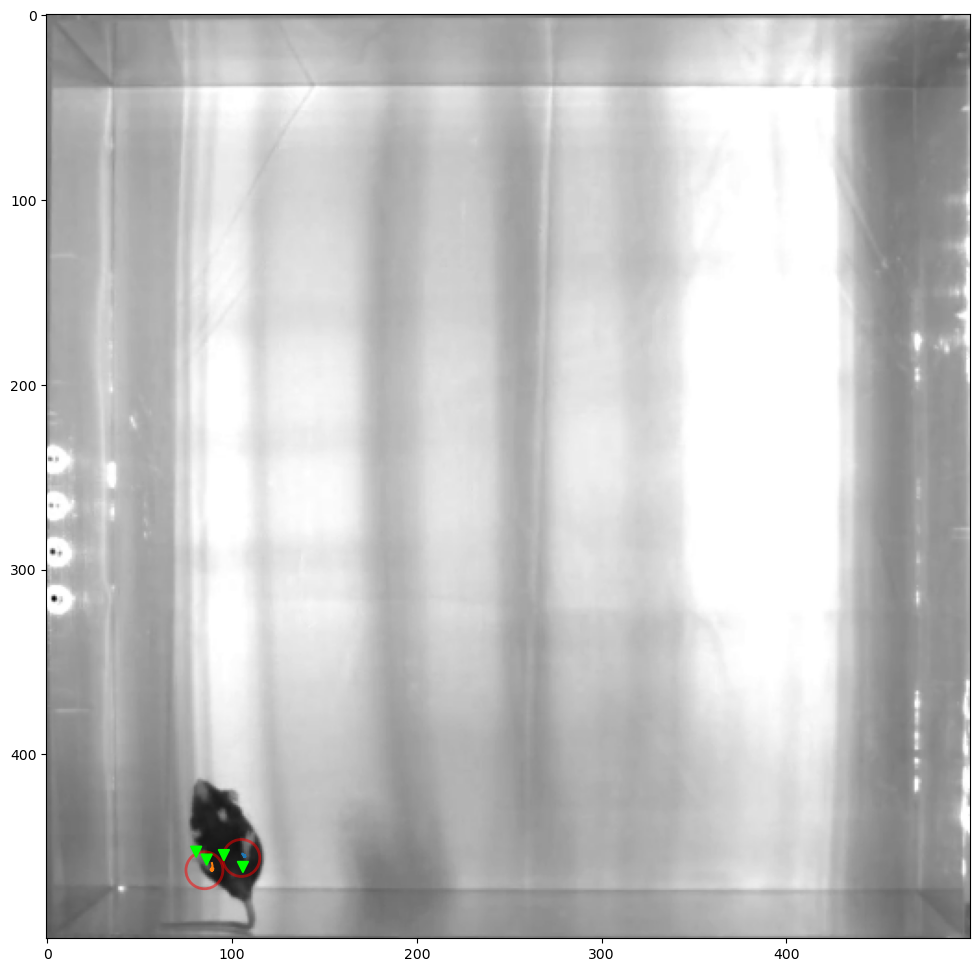

Video 31/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 3235/3235 [00:12<00:00, 259.60it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m19_recording2, steps: 628 -- left_back_paw, stride-length: 3.65 +/- 2.25, duration: 9.45 +/- 7.25


100%|██████████| 3131/3131 [00:11<00:00, 264.70it/s]


m19_recording2, steps: 597 -- right_back_paw, stride-length: 4.21 +/- 2.50, duration: 10.56 +/- 7.47


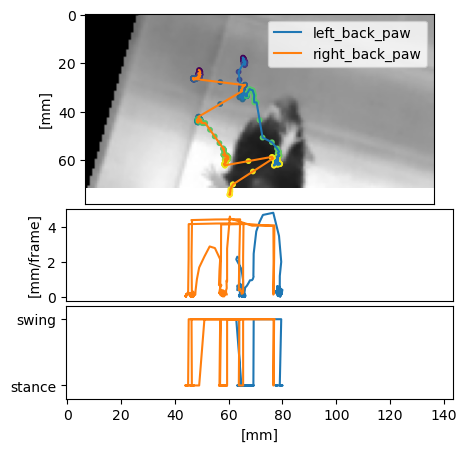

100%|██████████| 65661/65661 [00:00<00:00, 250856.40it/s]


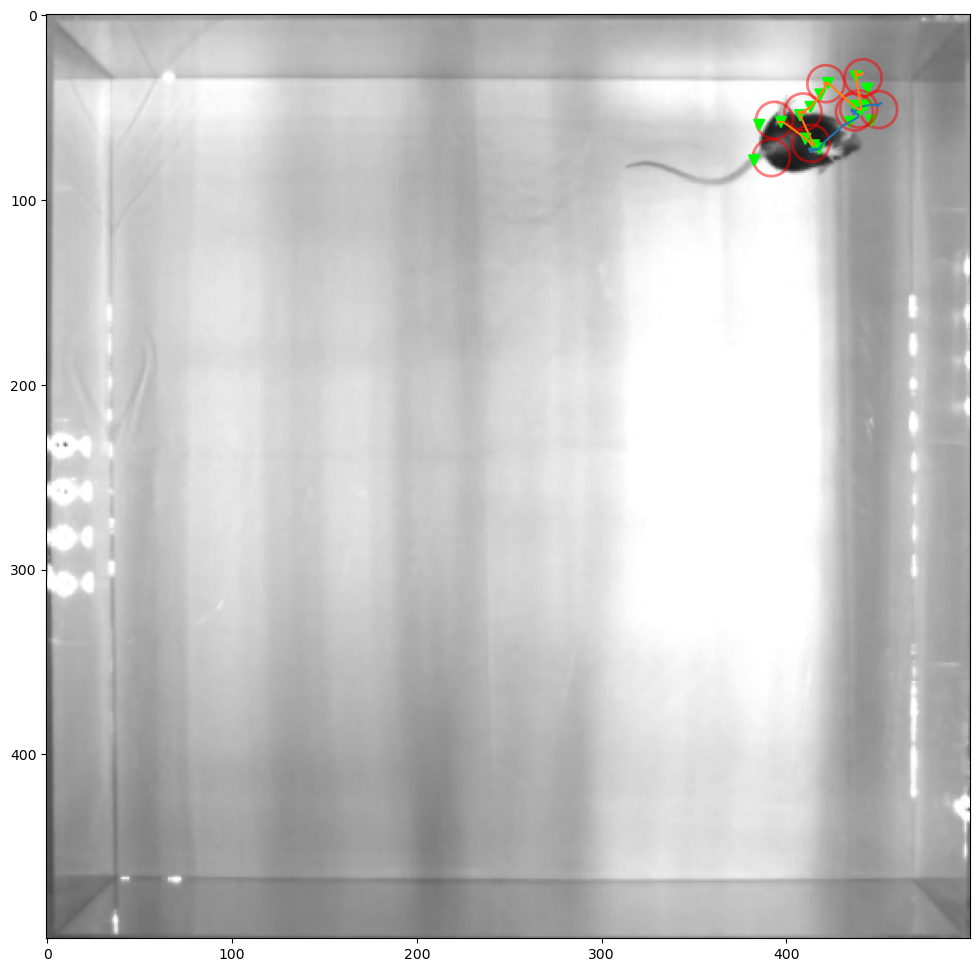

Video 32/32


/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 621/621 [00:02<00:00, 265.40it/s]
/home/andretelfer/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


m19_recording3, steps: 99 -- left_back_paw, stride-length: 5.11 +/- 3.09, duration: 14.44 +/- 8.06


100%|██████████| 573/573 [00:02<00:00, 266.74it/s]


m19_recording3, steps: 85 -- right_back_paw, stride-length: 5.66 +/- 3.10, duration: 14.96 +/- 9.46


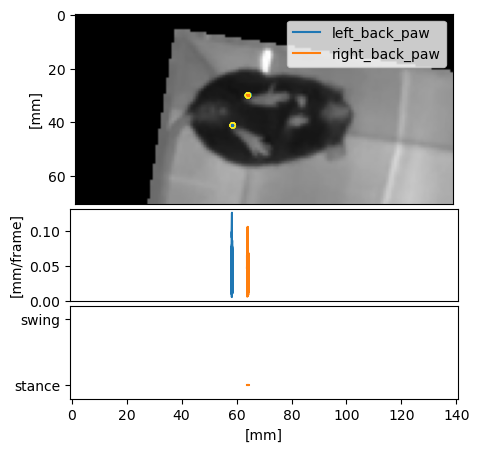

100%|██████████| 66000/66000 [00:00<00:00, 264282.54it/s]


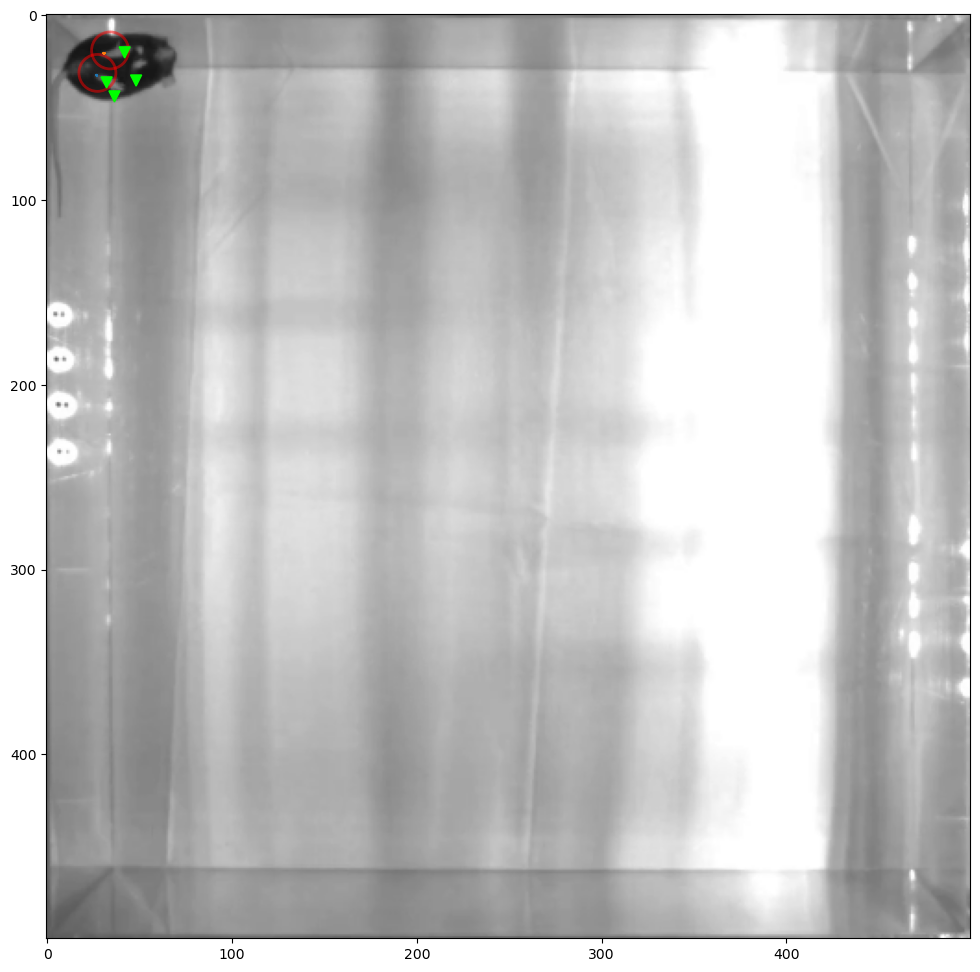

In [139]:
results = []

validation_dir = Path("validation")
! rm -rf {validation_dir}
! mkdir -p {validation_dir} 

print(len(raw_videos))
for video_idx, video in enumerate(raw_videos):
    print(f"Video {video_idx+1}/{len(raw_videos)}")
    fname = video.parts[-1].split('.')[0]

    try:
        dlc_file = next(data_folder.glob(f'labels/{fname}DLC*.h5'))
    except:
        print("DID NOT FIND DLC FILE!")
        continue

    video_analysis = VideoAnalysis(
        video,
        dlc_file)

    video_analysis.keypoints = filter_likelihood(video_analysis.keypoints, 0.8)
    video_analysis.keypoints = filter_distance_traveled(video_analysis.keypoints, 10, 1)
    
    # Registration
    video = Path(video_analysis.video).parts[-1]
    registration_points = pd.read_csv(data_folder / "registration_points.csv")
    registration_points['video'] = registration_points.video.apply(lambda x: Path(x).parts[-1])
    points = registration_points.groupby('video').get_group(video)[['y', 'x']].values
    w, h = 500, 500

    target = [[0,0], [w,0], [w,h], [0,h]]
    target = np.array(target)
    transformer = PerspectiveTransformer()
    transformer.register(points, target)
    keypoints = transformer.apply(video_analysis.keypoints)
    reader = VideoReader(video_analysis.video, transforms=[transformer])

    # Steps
    # for bodypart in ['left_back_paw']:
    for bodypart in ['left_back_paw', 'right_back_paw']:
        bodypart_df = keypoints.xs(bodypart, axis=1, level='bodyparts').droplevel(0, axis=1)

        distances = []
        distance_threshold = 0.8
        # distance_threshold = 1.4
        d = 5
        for i in range(1, d):
            deltas = bodypart_df.diff(i).shift(-i)
            distance = np.log(np.sqrt(deltas.x**2 + deltas.y**2))
            distances.append(distance)
            
        distances = sum(distances) / len(distances)
        distance_forward = distances < distance_threshold

        distances = []
        for i in range(-d, 0):
            deltas = bodypart_df.diff(i)
            distance = np.log(np.sqrt(deltas.x**2 + deltas.y**2))
            distances.append(distance)
            
        distances = sum(distances) / len(distances)
        distance_backwards = distances < distance_threshold
        phase = distance_forward | distance_backwards

        # Correction
        # ----------
        step_df = pd.DataFrame(index=distance.index, columns=['state', 'episode'])
        step_df.state = phase.apply(lambda x: 'swing' if x else 'stance')
        episode = 0
        last = None
        segment_start = 0
        for idx in tqdm(step_df.index):
            current = step_df.loc[idx].state
            if current != last:
                step_df.loc[segment_start:idx, 'episode'] = episode
                episode += 1
                segment_start = idx
                last = current

        step_df.loc[segment_start:idx, 'episode'] = episode

        # Collapse small episodes
        min_episode_size = 3
        for episode in tqdm(sorted(step_df.episode.unique())):
            index = step_df[step_df.episode == episode].iloc[0].name
            if index-1 not in step_df.index:
                continue

            previous = step_df.loc[index-1]

            # Collapse small episodes
            if (step_df.episode == episode).sum() < min_episode_size:
                step_df.loc[step_df.episode == episode, 'episode'] = previous.episode
                step_df.loc[step_df.episode == episode, 'state'] = previous.state
                
            # Collapse side by side episodes of the same state
            if step_df.loc[index, 'state'] == previous.state:
                step_df.loc[step_df.episode == episode, 'episode'] = previous.episode

        # Renumber episodes
        episode_renumbering = {o:n for n,o in enumerate(sorted(step_df.episode.unique()))}
        step_df.episode = step_df.episode.apply(lambda x: episode_renumbering[x])

        # Episode output
        episode_df = pd.DataFrame(columns=['stride_length', 'duration', 'state', 'start', 'end'], index=sorted(step_df.episode.unique()))

        for episode, group in step_df.groupby('episode'):
            group = group.dropna()

            start_index = group.iloc[0].name
            end_index = group.iloc[-1].name

            deltas = bodypart_df.loc[[start_index,end_index]].diff().iloc[1]
            distance = np.sqrt(deltas.x**2 + deltas.y**2)

            episode_df.loc[episode, 'state'] = group.iloc[0].state
            episode_df.loc[episode, 'stride_length'] = distance
            episode_df.loc[episode, 'duration'] = end_index - start_index
            episode_df.loc[episode, 'start'] = start_index
            episode_df.loc[episode, 'end'] = end_index
            # TODO look at distance left/right along line

        episode_df = episode_df.dropna()

        # Remove outliers 
        episode_df['duration'] = episode_df['duration'].apply(lambda x: np.nan if x > 30 else x)
        # episode_df['stride_length'] = episode_df['stride_length'].apply(lambda x: np.nan if x < 10 else x)
        episode_df['stride_length'] = episode_df['stride_length'].apply(lambda x: np.nan if x > 120 else x)

        # for column in ['stride_length', 'duration']:
        #     std = episode_df[column].std()
        #     mean = episode_df[column].mean()
        #     episode_df[column] = episode_df[column].apply(lambda x: np.nan if x > mean+3*std else x)

        episode_df = episode_df.dropna()

        swing = episode_df[episode_df.state == 'swing']
        print(f"{fname}, steps: {len(swing)} -- {bodypart}, "
              f"stride-length: {swing.stride_length.mean():.2f} +/- {swing.stride_length.std():.2f}, "
              f"duration: {swing.duration.mean():.2f} +/- {swing.duration.std():.2f}")

        result = dict(
            video=video,
            bodypart=bodypart,
            steps=len(swing),
            stride_length_median=swing.stride_length.median(),
            stride_length_mean=swing.stride_length.mean(),
            stride_length_var=swing.stride_length.var(),
            duration_median=swing.duration.median(),
            duration_mean=swing.duration.mean(),
            duration_std=swing.duration.std(),
        )
        results.append(result)    

    # Validate
    ! mkdir -p {validation_dir/fname}
    start = 11000
    duration = 500
    end = start + duration
    bodyparts = ['left_back_paw', 'right_back_paw' ]
    keypoints = transformer.apply(video_analysis.keypoints)
    reader = VideoReader(video_analysis.video, transforms=[transformer])
    visualize_step_by_distance(
        reader, keypoints, bodyparts, start, duration, marker_size=10, threshold=2)
    
    plt.savefig(validation_dir / fname / 'fig1.png')
    plt.show()
    plt.close()

    plot_steps(
        reader, 
        keypoints, 
        start, 
        duration,
        stance_threshold=1.4, 
        swing_threshold=2.0,
        rolling_window=5,
        display_touch_positions=True)

    plt.savefig(validation_dir / fname / 'fig2.png')
    plt.show()
    plt.close()


In [129]:
ls {data_folder}/labels/m13

/home/andretelfer/shared/curated/thea/v3/labels/m13-1_recording1DLC_resnet50_GaitFeb28shuffle2_1030000.h5
/home/andretelfer/shared/curated/thea/v3/labels/m13-1_recording1DLC_resnet50_GaitFeb28shuffle2_1030000_labeled.mp4
/home/andretelfer/shared/curated/thea/v3/labels/m13-1_recording1DLC_resnet50_GaitFeb28shuffle2_1030000_meta.pickle
/home/andretelfer/shared/curated/thea/v3/labels/m13-2_recording1DLC_resnet50_GaitFeb28shuffle2_1030000.h5
/home/andretelfer/shared/curated/thea/v3/labels/m13-2_recording1DLC_resnet50_GaitFeb28shuffle2_1030000_labeled.mp4
/home/andretelfer/shared/curated/thea/v3/labels/m13-2_recording1DLC_resnet50_GaitFeb28shuffle2_1030000_meta.pickle
/home/andretelfer/shared/curated/thea/v3/labels/m13_acclimationDLC_resnet50_GaitFeb28shuffle2_1030000.h5
/home/andretelfer/shared/curated/thea/v3/labels/m13_acclimationDLC_resnet50_GaitFeb28shuffle2_1030000_labeled.mp4
/home/andretelfer/shared/curated/thea/v3/labels/m13_acclimationDLC_resnet50_GaitFeb28shuffle2_1030000_meta.pi

In [144]:
results

[{'video': 'm01_baseline.mp4',
  'bodypart': 'left_back_paw',
  'steps': 801,
  'stride_length_median': 3.449254637454601,
  'stride_length_mean': 4.036070838749013,
  'stride_length_var': 5.845523026393395,
  'duration_median': 9.0,
  'duration_mean': 11.379525593008738,
  'duration_std': 7.798447298960017},
 {'video': 'm01_baseline.mp4',
  'bodypart': 'right_back_paw',
  'steps': 914,
  'stride_length_median': 3.5825895386123863,
  'stride_length_mean': 4.088551642888013,
  'stride_length_var': 6.0557268447697945,
  'duration_median': 12.0,
  'duration_mean': 12.560175054704596,
  'duration_std': 7.4744684354209605},
 {'video': 'm01_recording1.mp4',
  'bodypart': 'left_back_paw',
  'steps': 412,
  'stride_length_median': 3.6275146724560168,
  'stride_length_mean': 4.20083394719876,
  'stride_length_var': 6.524085208131775,
  'duration_median': 11.0,
  'duration_mean': 12.048543689320388,
  'duration_std': 7.572364457030977},
 {'video': 'm01_recording1.mp4',
  'bodypart': 'right_back_

In [145]:
pd.DataFrame(results).to_csv('results.csv')

In [146]:
df = pd.DataFrame(results)
df

,video,bodypart,steps,stride_length_median,stride_length_mean,stride_length_var,duration_median,duration_mean,duration_std
0,m01_baseline.mp4,left_back_paw,801,3.449255,4.036071,5.845523,9.0,11.379526,7.798447
1,m01_baseline.mp4,right_back_paw,914,3.582590,4.088552,6.055727,12.0,12.560175,7.474468
2,m01_recording1.mp4,left_back_paw,412,3.627515,4.200834,6.524085,11.0,12.048544,7.572364
3,m01_recording1.mp4,right_back_paw,438,4.173680,4.669902,9.214440,13.0,14.116438,8.131227
4,m01_recording2.mp4,left_back_paw,644,3.849859,4.386099,6.587060,10.0,11.767081,7.661487
5,m01_recording2.mp4,right_back_paw,649,4.259930,4.547557,6.235085,13.0,13.870570,7.561183
6,m01_recording3.mp4,left_back_paw,422,4.573751,4.908202,7.645362,12.0,12.625592,8.017624
7,m01_recording3.mp4,right_back_paw,444,4.690384,4.777280,6.881505,14.0,14.254505,8.314941
8,m03_baseline.mp4,left_back_paw,799,3.343899,3.854755,5.237038,9.0,10.327910,7.092663
9,m03_baseline.mp4,right_back_paw,754,3.430328,3.876283,5.273969,8.0,10.051724,7.125975


In [132]:
for v in df.video:
    try:
        name_extraction.match(v).groups()
    except:
        print(v)


In [147]:
import re

name_extraction = re.compile("(m\d+)(\-\d)?\_([a-zA-Z0-9]*)\.mp4")
for idx, row in df.iterrows():
    mouse, version, recording = name_extraction.match(row.video).groups()
    df.loc[idx, 'mouse'] = mouse
    df.loc[idx, 'version'] = version
    df.loc[idx, 'recording'] = recording

df

,video,bodypart,steps,stride_length_median,stride_length_mean,stride_length_var,duration_median,duration_mean,duration_std,mouse,version,recording
0,m01_baseline.mp4,left_back_paw,801,3.449255,4.036071,5.845523,9.0,11.379526,7.798447,m01,NaN,baseline
1,m01_baseline.mp4,right_back_paw,914,3.582590,4.088552,6.055727,12.0,12.560175,7.474468,m01,NaN,baseline
2,m01_recording1.mp4,left_back_paw,412,3.627515,4.200834,6.524085,11.0,12.048544,7.572364,m01,NaN,recording1
3,m01_recording1.mp4,right_back_paw,438,4.173680,4.669902,9.214440,13.0,14.116438,8.131227,m01,NaN,recording1
4,m01_recording2.mp4,left_back_paw,644,3.849859,4.386099,6.587060,10.0,11.767081,7.661487,m01,NaN,recording2
5,m01_recording2.mp4,right_back_paw,649,4.259930,4.547557,6.235085,13.0,13.870570,7.561183,m01,NaN,recording2
6,m01_recording3.mp4,left_back_paw,422,4.573751,4.908202,7.645362,12.0,12.625592,8.017624,m01,NaN,recording3
7,m01_recording3.mp4,right_back_paw,444,4.690384,4.777280,6.881505,14.0,14.254505,8.314941,m01,NaN,recording3
8,m03_baseline.mp4,left_back_paw,799,3.343899,3.854755,5.237038,9.0,10.327910,7.092663,m03,NaN,baseline
9,m03_baseline.mp4,right_back_paw,754,3.430328,3.876283,5.273969,8.0,10.051724,7.125975,m03,NaN,baseline


In [148]:
df.to_csv('results2.csv')

In [149]:
results = pd.read_csv('results2.csv', index_col=0)
results

,video,bodypart,steps,stride_length_median,stride_length_mean,stride_length_var,duration_median,duration_mean,duration_std,mouse,version,recording
0,m01_baseline.mp4,left_back_paw,801,3.449255,4.036071,5.845523,9.0,11.379526,7.798447,m01,NaN,baseline
1,m01_baseline.mp4,right_back_paw,914,3.582590,4.088552,6.055727,12.0,12.560175,7.474468,m01,NaN,baseline
2,m01_recording1.mp4,left_back_paw,412,3.627515,4.200834,6.524085,11.0,12.048544,7.572364,m01,NaN,recording1
3,m01_recording1.mp4,right_back_paw,438,4.173680,4.669902,9.214440,13.0,14.116438,8.131227,m01,NaN,recording1
4,m01_recording2.mp4,left_back_paw,644,3.849859,4.386099,6.587060,10.0,11.767081,7.661487,m01,NaN,recording2
5,m01_recording2.mp4,right_back_paw,649,4.259930,4.547557,6.235085,13.0,13.870570,7.561183,m01,NaN,recording2
6,m01_recording3.mp4,left_back_paw,422,4.573751,4.908202,7.645362,12.0,12.625592,8.017624,m01,NaN,recording3
7,m01_recording3.mp4,right_back_paw,444,4.690384,4.777280,6.881505,14.0,14.254505,8.314941,m01,NaN,recording3
8,m03_baseline.mp4,left_back_paw,799,3.343899,3.854755,5.237038,9.0,10.327910,7.092663,m03,NaN,baseline
9,m03_baseline.mp4,right_back_paw,754,3.430328,3.876283,5.273969,8.0,10.051724,7.125975,m03,NaN,baseline


In [173]:
results = pd.read_csv('results2.csv', index_col=0)
temp = results.groupby('video').agg({'mouse': 'first', 'steps': 'mean', 'stride_length_mean': 'mean', 'stride_length_var': 'mean', 'duration_mean': 'mean', 'duration_std': 'mean', 'recording': 'first'})

for idx, group in temp.groupby('mouse'):
    baseline = group[group.recording == 'baseline'].iloc[0]

    temp.loc[group.index, 'stride_length_mean'] /= baseline['stride_length_mean']
    temp.loc[group.index, 'stride_length_var'] /= baseline['stride_length_var']
    temp.loc[group.index, 'duration_mean'] /= baseline['duration_mean']
    temp.loc[group.index, 'duration_std'] /= baseline['duration_std']

treatments = pd.read_csv(data_folder/'treatments.csv')
treatments['mouse'] = treatments.Animal.apply(lambda x: f"m{x:02}")
treatments['treatment'] = treatments['Treatment ']
treatments = treatments[['mouse', 'treatment']]
temp = temp.merge(treatments, on='mouse')

order = ['baseline', 'recording1', 'recording2', 'recording3']
temp['order'] = temp.recording.apply(lambda x: order.index(x))
temp

,mouse,steps,stride_length_mean,stride_length_var,duration_mean,duration_std,recording,treatment,order
0,m01,857.5,1.000000,1.000000,1.000000,1.000000,baseline,PQ,0
1,m01,857.5,1.000000,1.000000,1.000000,1.000000,baseline,PQ,0
2,m01,857.5,1.000000,1.000000,1.000000,1.000000,baseline,PQ,0
3,m01,857.5,1.000000,1.000000,1.000000,1.000000,baseline,PQ,0
4,m01,425.0,1.091834,1.322426,1.092954,1.028199,recording1,PQ,1
...,...,...,...,...,...,...,...,...,...
111,m19,612.5,1.119479,1.158881,0.941986,0.972103,recording2,PQ,2
112,m19,92.0,1.534539,1.962137,1.384445,1.156798,recording3,PQ,3
113,m19,92.0,1.534539,1.962137,1.384445,1.156798,recording3,PQ,3
114,m19,92.0,1.534539,1.962137,1.384445,1.156798,recording3,PQ,3


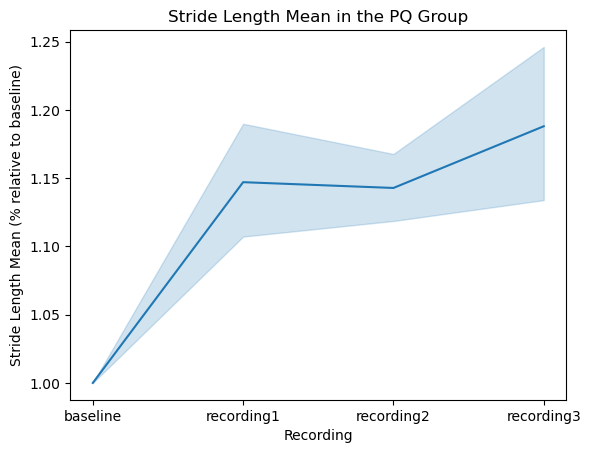

In [182]:
sns.lineplot(data=temp, x='order', y='stride_length_mean')
plt.ylabel('Stride Length Mean (% relative to baseline)')

xticks, xlabels = plt.xticks()
plt.xticks(ticks=[0,1,2,3], labels=order)
plt.xlabel("Recording")
plt.title("Stride Length Mean in the PQ Group")
plt.savefig('PQ-stride-length-mean.png')

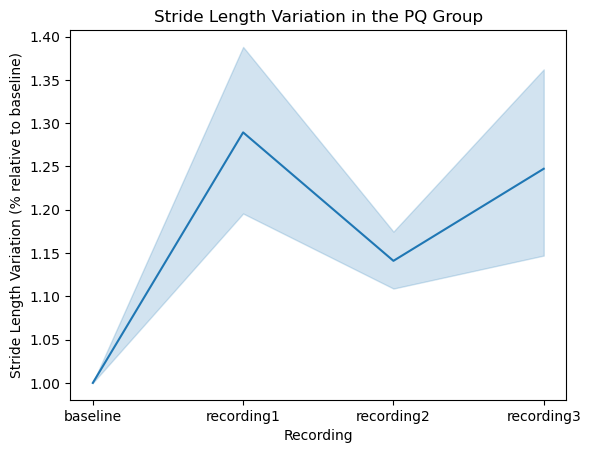

In [183]:
sns.lineplot(data=temp, x='order', y='stride_length_var')
plt.ylabel('Stride Length Variation (% relative to baseline)')

xticks, xlabels = plt.xticks()
plt.xticks(ticks=[0,1,2,3], labels=order)
plt.xlabel("Recording")
plt.title("Stride Length Variation in the PQ Group")
plt.savefig('PQ-stride-length-var.png')

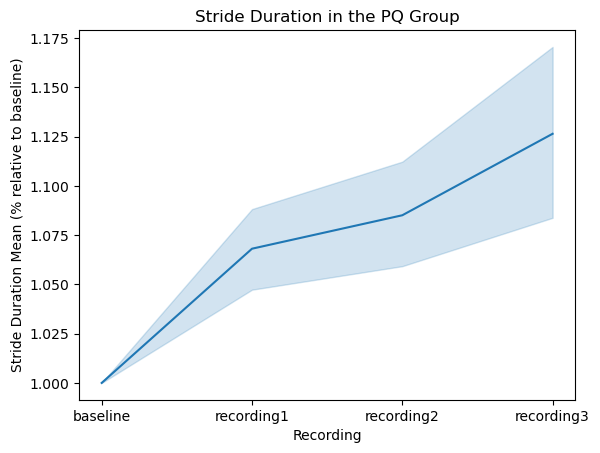

In [184]:
sns.lineplot(data=temp, x='order', y='duration_mean')
plt.ylabel('Stride Duration Mean (% relative to baseline)')

xticks, xlabels = plt.xticks()
plt.xticks(ticks=[0,1,2,3], labels=order)
plt.xlabel("Recording")
plt.title("Stride Duration in the PQ Group")
plt.savefig('PQ-stride-duration-mean.png')

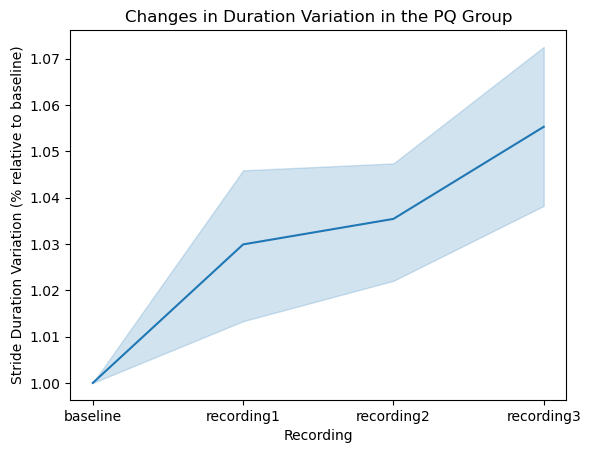

In [185]:
sns.lineplot(data=temp, x='order', y='duration_std')
plt.ylabel('Stride Duration Variation (% relative to baseline)')

xticks, xlabels = plt.xticks()
plt.xticks(ticks=[0,1,2,3], labels=order)
plt.xlabel("Recording")
plt.title("Changes in Duration Variation in the PQ Group")
plt.savefig('PQ-stride-duration-var.png')